In [2]:
import pymc3 as pm
import numpy as np
import scipy.stats as stats
import scipy.special as special
import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf 
import numpy.matlib
import theano.tensor as tt
import warnings

from sklearn import preprocessing
from theano import shared
from scipy.special import expit as logistic
from scipy.special import softmax
from scipy.stats import betabinom
from matplotlib.patches import Ellipse, transforms

In [3]:
%config InlineBackend.figure_format = 'retina'
warnings.simplefilter(action='ignore', category=(FutureWarning, UserWarning))
az.style.use('arviz-darkgrid')

In [4]:
RANDOM_SEED = 42
np.random.seed(42)

In [5]:
import sys, IPython, scipy, matplotlib, pandas, seaborn, patsy, platform, theano, sklearn, statsmodels
print("""This notebook was created using:
Python {}
IPython {}
PyMC3 {}
ArviZ {}
NumPy {}
SciPy {}
Pandas {}
Seaborn {}
Patsy {}
Matplotlib {}
Theano {}
Sklearn {}
Statsmodels {}\n""".format(sys.version[:5], 
                             IPython.__version__, 
                             pm.__version__, 
                             az.__version__, 
                             np.__version__, 
                             scipy.__version__, 
                             pandas.__version__, 
                             seaborn.__version__, 
                             patsy.__version__, 
                             matplotlib.__version__, 
                             theano.__version__, 
                             sklearn.__version__, 
                             statsmodels.api.__version__))

This notebook was created using:
Python 3.7.4
IPython 7.13.0
PyMC3 3.9.2
ArviZ 0.9.0
NumPy 1.18.2
SciPy 1.4.1
Pandas 1.0.3
Seaborn 0.10.0
Patsy 0.5.1
Matplotlib 3.2.1
Theano 1.0.4
Sklearn 0.22.2.post1
Statsmodels 0.11.1



# Chapter 14 Adventures in Covariance

If we can figure out a way to pool information across parameter types—intercepts and slopes—what the robot learns in the morning can improve learning about afternoons, and vice versa. 

In this chapter, you’ll see how to really do this, to specify varying slopes in combina- tion with the varying intercepts of the previous chapter. 

The machinery that makes such complex varying effects possible will be used later in the chapter to extend the varying effects strategy to more subtle model types, including the use of continuous categories, using **Gaussian processes**. Ordinary varying effects work only with discrete, unordered categories, such as individuals, countries, or ponds. In these cases, each category is equally different from all of the others. But it is possible to use pooling with categories such as age or location. In these cases, some ages and some locations are more similar than others. 

Finally, we’ll circle back to causal inference and use our new powers over covariance to go beyond the back-door criterion (Chapter 6), using instrumental variables and a mediation technique known as the front-door criterion.

## 14.1. Varying slopes by construction

The variance-covariance matrix, vcov, for a fit model describes how each parameter’s posterior probability is associated with each other parameter’s posterior probability. Now we’ll use the same kind of distribution to describe the variation within and covariation among different kinds of varying effects. Varying intercepts have variation, and varying slopes have variation. Inter- cepts and slopes covary.

**Rethinking**: Why Gaussian? There is no reason the multivariate distribution of intercepts and slopes must be Gaussian. But there are both practical and epistemological justifications. On the practical side, there aren’t many multivariate distributions that are easy to work with. The only common ones are multivariate Gaussian and multivariate Student (or “t”) distributions. On the epistemological side, if all we want to say about these intercepts and slopes is their means, variances, and covariances, then the maximum entropy distribution is multivariate Gaussian.

### 14.1.1. Simulate the population

### Code 14.1

In [5]:
a = 3.5       # average morning wait time
b = (-1)      # average difference afternoon wait time
sigma_a = 1   # std dev in intercepts
sigma_b = 0.5 # std dev in slopes
rho = (-0.7)  # correlation between intercepts and slopes

### Code 14.2

In [6]:
Mu = [a, b]

That’s it. The value in $a$ is the mean intercept, the wait in the morning. And the value in $b$ is the mean slope, the difference in wait between afternoon and morning.

### Code 14.3

In [7]:
cov_ab = sigma_a*sigma_b*rho
Sigma = np.array([[sigma_a ** 2, cov_ab], [cov_ab, sigma_b ** 2]])
Sigma

array([[ 1.  , -0.35],
       [-0.35,  0.25]])

### Code 14.5

In [8]:
sigmas = [sigma_a, sigma_b]
# correlation matrix
Rho = np.matrix([[1, rho], [rho, 1]])
# now matrix multiply to get covariance matrix
Sigma = np.diag(sigmas) * Rho * np.diag(sigmas)
Sigma

matrix([[ 1.  , -0.35],
        [-0.35,  0.25]])

### Code 14.6

In [9]:
N_cafes = 20

### Code 14.7

In [10]:
vary_effects = np.random.multivariate_normal(mean=Mu, cov=Sigma, size=N_cafes)
vary_effects

array([[ 2.99007052, -0.84875098],
       [ 3.04415563, -0.27234876],
       [ 3.70364326, -1.16450931],
       [ 2.02692891, -0.14325263],
       [ 4.03252153, -1.01469154],
       [ 3.90274672, -1.32631384],
       [ 3.02501922, -1.50116327],
       [ 5.14285537, -1.84985974],
       [ 4.54374489, -1.29834208],
       [ 4.22780251, -1.79500873],
       [ 2.01772114, -0.49697279],
       [ 3.25809977, -1.41726504],
       [ 4.05388149, -1.17841061],
       [ 4.68840542, -1.33325246],
       [ 4.06029235, -1.32579574],
       [ 4.32451698, -0.6585591 ],
       [ 3.38356498, -1.33466168],
       [ 2.53382098, -1.05841776],
       [ 3.05217342, -1.52855716],
       [ 4.84230641, -1.45825864]])

### Code 14.8

In [11]:
a_cafe = vary_effects[:, 0]
b_cafe = vary_effects[:, 1]

### Code 14.9

In [12]:
def Gauss2d(mu, cov, ci, ax=None):
    """Copied from statsmodel"""
    if ax is None:
        _, ax = plt.subplots(figsize=(8, 5))

    v_, w = np.linalg.eigh(cov)
    u = w[0] / np.linalg.norm(w[0])
    angle = np.arctan(u[1] / u[0])
    angle = 180 * angle / np.pi  # convert to degrees

    for level in ci:
        v = 2 * np.sqrt(
            v_ * stats.chi2.ppf(level, 2)
        )  # get size corresponding to level
        ell = Ellipse(
            mu[:2],
            v[0],
            v[1],
            180 + angle,
            facecolor="None",
            edgecolor="k",
            alpha=(1 - level) * 0.5,
            lw=1.5,
        )
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(0.3)
        ax.add_artist(ell)

    return ax

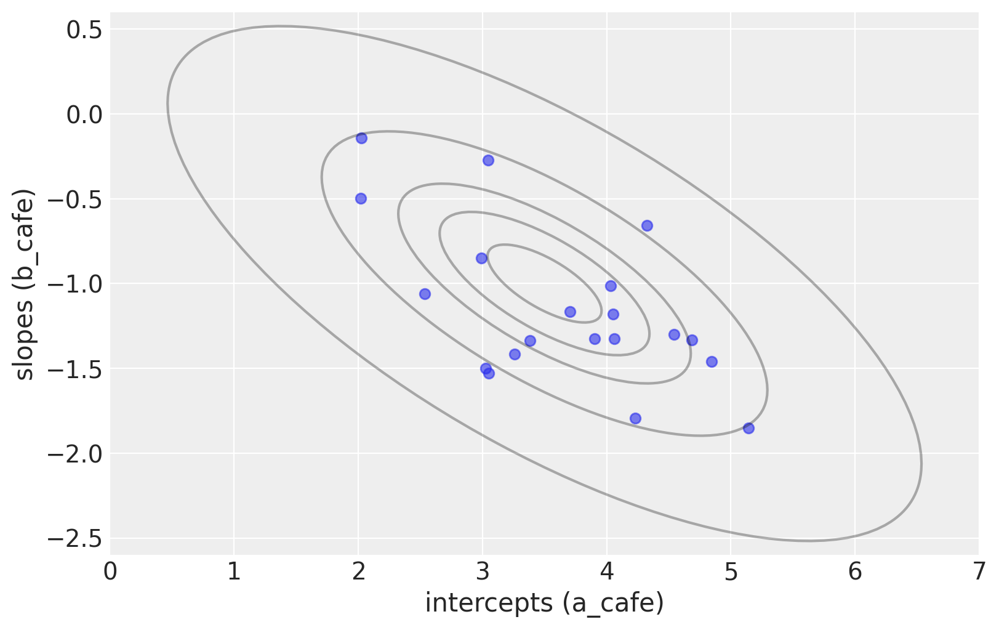

In [13]:
ax = Gauss2d(Mu, np.asarray(Sigma), [0.1, 0.3, 0.5, 0.8, 0.99])
ax.scatter(a_cafe, b_cafe, alpha=0.6)
ax.set_xlim(0, 7)
ax.set_ylim(-2.6, 0.6)
ax.set_xlabel('intercepts (a_cafe)')
ax.set_ylabel('slopes (b_cafe)');

$cov(x,y) = σ_x \times σ_y \times ρ_{xy}$ is as justified as it is convenient.

$ρ_{xy}$ is the correlation between the two variables

### 14.1.2. Simulate observations

### Code 14.10

In [14]:
N_visits = 10

afternoon = np.tile([0, 1], N_visits * N_cafes // 2)  # wrap with int() to suppress warnings

cafe_id = np.repeat(np.arange(0, N_cafes), N_visits)  # 1-20 (minus 1 for python indexing)

mu = a_cafe[cafe_id] + b_cafe[cafe_id]*afternoon

sigma = 0.5  # std dev within cafes

wait = np.random.normal(loc=mu, scale=sigma, size=N_visits * N_cafes)

df = pd.DataFrame(dict(cafe=cafe_id, afternoon=afternoon, wait=wait))
df

,cafe,afternoon,wait
0,0,0,3.359304
1,0,1,2.227004
2,0,0,2.932246
3,0,1,1.990768
4,0,0,2.250810
...,...,...,...
195,19,1,3.701007
196,19,0,3.829735
197,19,1,3.477275
198,19,0,4.511413


### 14.1.3. The varying slopes model

### Code 14.11

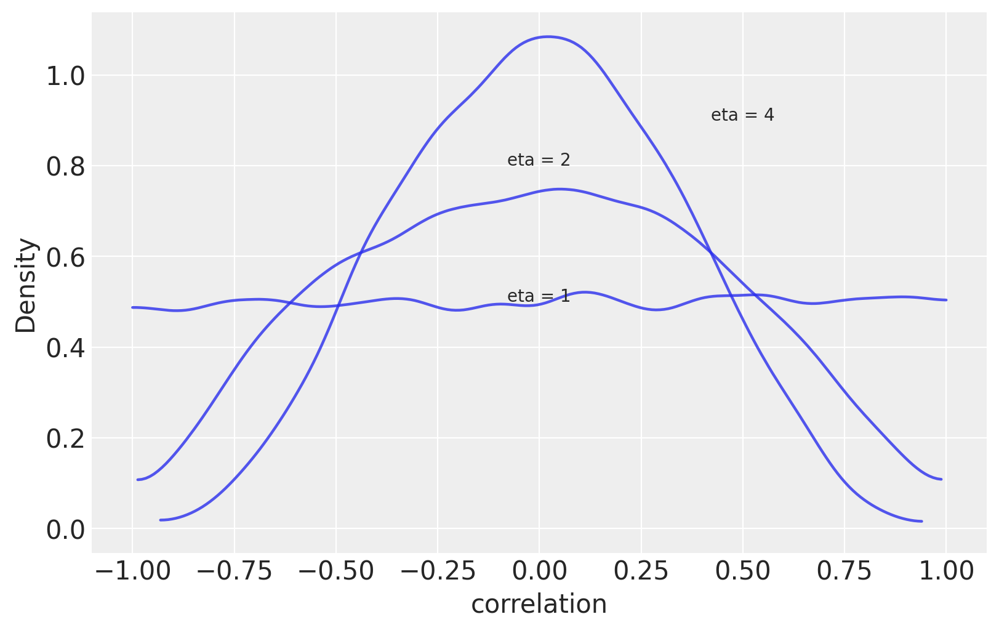

In [15]:
_, ax = plt.subplots(1, 1, figsize=(8, 5))
textloc = [[0, 0.5], [0, 0.8], [0.5, 0.9]]

for eta, loc in zip([1, 2, 4], textloc):
    R = pm.LKJCorr.dist(n=2, eta=eta).random(size=10000)
    az.plot_kde(R, plot_kwargs={"alpha": 0.8})
    ax.text(loc[0], loc[1], "eta = %s" % (eta), horizontalalignment="center")

ax.set_xlabel("correlation")
ax.set_ylabel("Density");

### Code 14.12

In [16]:
# define model: wait time ~ morning + afternoon
with pm.Model() as m14_1:   
    
    # hyper-priors
    a = pm.Normal('a', mu=5, sd=2)
    b = pm.Normal('b', mu=-1, sd=0.5)
    sigma_within = pm.Exponential('sigma_within', 1)  # prior stddev within cafes
  
    # LKJCholeskyCov is more efficient than LKJCorr
    # PyMC >= 3.9 extracts the stds and matrix of correlations automatically for us
    chol, Rho_, sigma_cafe = pm.LKJCholeskyCov('chol_cov', n=2, eta=2, 
                                               sd_dist=pm.Exponential.dist(1.0),
                                              compute_corr=True)
    
    # population of varying effects
    # shape needs to be (N_cafes, 2) because we're getting back both a and b for each cafe
    ab_cafe = pm.MvNormal('ab_cafe', mu=tt.stack((a, b)), chol=chol, shape=(N_cafes, 2))

    # linear model
    mu = pm.Deterministic('mu', ab_cafe[df['cafe'].values, 0] 
                          + ab_cafe[df['cafe'].values, 1]*df['afternoon'].values)
    
    # likelihood
    wait = pm.Normal('wait', mu=mu, sd=sigma_within, observed=df['wait'].values)
    
    trace_m14_1 = pm.sample(1000, tune=1000, target_accept=0.9, random_seed=RANDOM_SEED)
    
    
    idata_m14_1 = az.from_pymc3(trace_m14_1,
                                dims={'ab_cafe': ['cafe_nbr', 'var_effect']},
                                coords={'chol_cov_stds_dim_0': ['intercepts', 'slopes'],
                                        'var_effect': ['intercepts', 'slopes']})
    
    post = idata_m14_1.posterior = idata_m14_1.posterior.rename_vars(
        {'chol_cov_corr': 'Rho', 'chol_cov_stds': 'sigma_cafe'})
    

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ab_cafe, chol_cov, sigma_within, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 27 seconds.


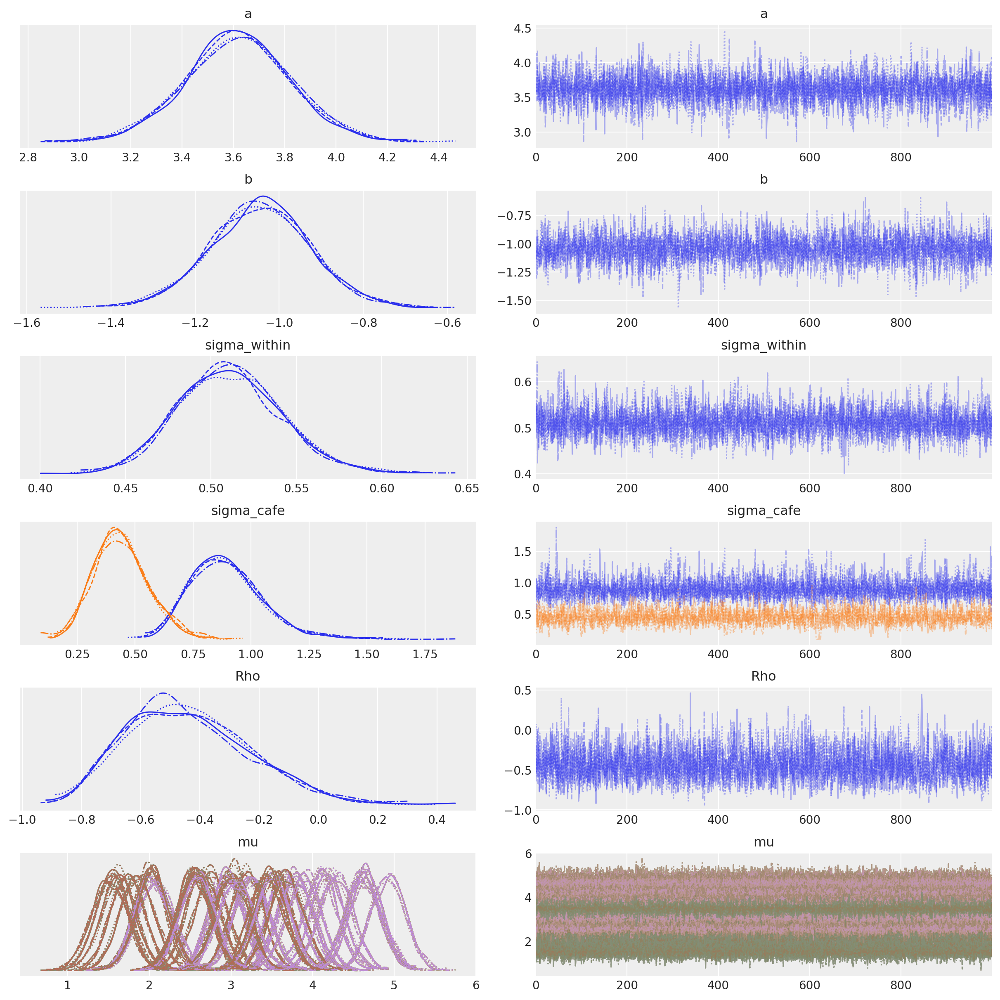

In [18]:
az.plot_trace(
    idata_m14_1,
    compact=True,
    var_names=["~ab_cafe", "~chol_cov", "~mu"],
    coords={"chol_cov_corr_dim_0": 1, "chol_cov_corr_dim_1": 0}
);

### Code 14.13

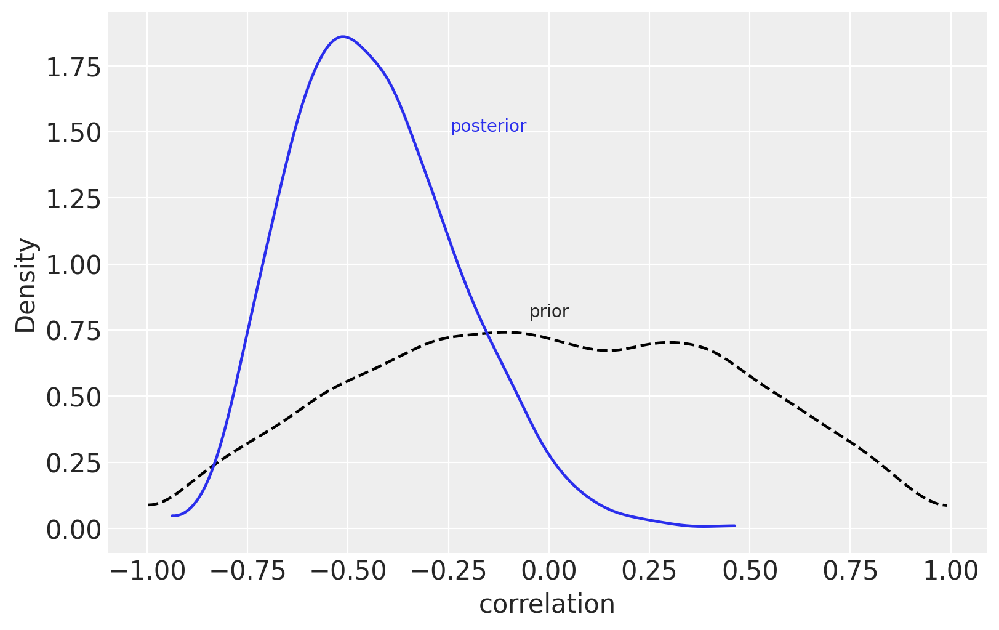

In [19]:
_, ax = plt.subplots(1, 1, figsize=(8, 5))

R = pm.LKJCorr.dist(n=2, eta=2).random(size=10000)
az.plot_kde(R, plot_kwargs={"color": "k", "linestyle": "--"})
ax.text(0, 0.8, "prior", horizontalalignment="center")

az.plot_kde(post["Rho"].sel(chol_cov_corr_dim_0=1, chol_cov_corr_dim_1=0),
    plot_kwargs={"color": "C0"})

ax.text(-0.15, 1.5, "posterior", color="C0", horizontalalignment="center")

ax.set_xlabel("correlation")
ax.set_ylabel("Density");

### Code 14.14 and 14.15

In [20]:
a = df.groupby(["afternoon", "cafe"]).agg("mean").unstack(level=0)
a

wait          
afternoon         0         1
cafe                         
0          2.892798  1.985770
1          3.061176  2.954228
2          3.655308  2.572413
3          1.815392  2.047477
4          4.116059  3.035740
5          3.833162  2.496826
6          3.047456  1.451982
7          5.048576  3.525149
8          4.732725  3.126347
9          3.877590  2.486710
10         1.834206  1.645761
11         3.311901  1.940308
12         4.226278  3.027695
13         4.594247  3.807776
14         3.956068  2.609661
15         4.236028  3.566631
16         3.492890  2.553231
17         2.528964  1.714501
18         3.239970  1.244699
19         4.719528  3.507814

In [21]:
# compute unpooled estimates directly from data
a1b1 = df.groupby(["afternoon", "cafe"]).agg("mean").unstack(level=0).values
a1 = a1b1[:, 0]
b1 = a1b1[:, 1] - a1

# extract posterior means of partially pooled estimates
a2b2 = post["ab_cafe"].mean(dim=("chain", "draw"))
a2 = a2b2.sel(var_effect="intercepts")
b2 = a2b2.sel(var_effect="slopes")

# compute posterior mean bivariate Gaussian
ab = post[["a", "b"]].mean(dim=("chain", "draw"))
Mu_est = np.array([ab["a"], ab["b"]])
chol_model = pm.expand_packed_triangular(
    2, post["chol_cov"].mean(dim=("chain", "draw")), lower=True
).eval()
Sigma_est = np.dot(chol_model, chol_model.T)

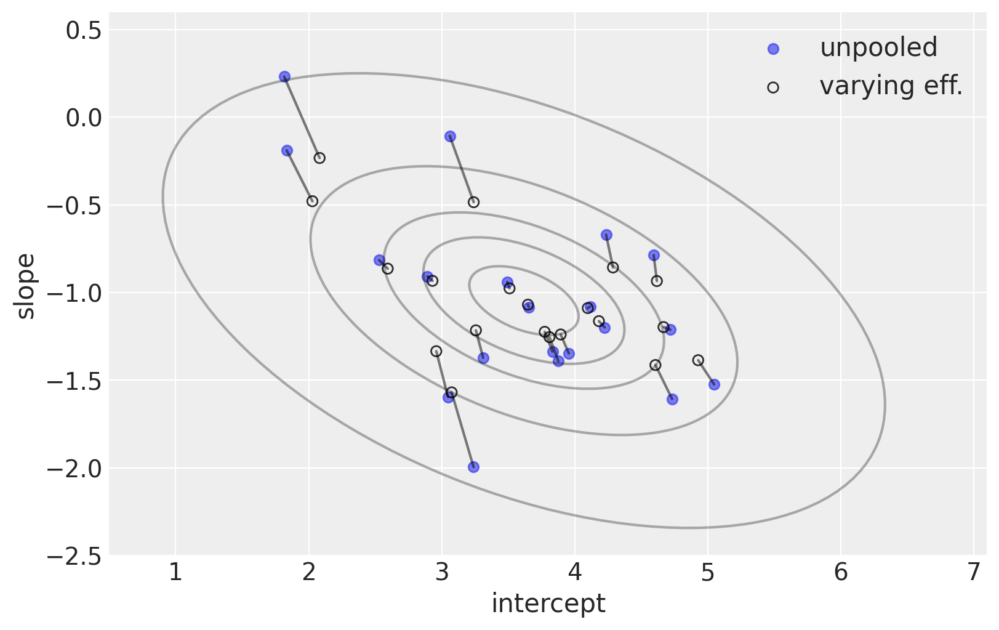

In [22]:
# draw contours
_, ax = plt.subplots(1, 1, figsize=(8, 5))
_ = Gauss2d(mu=Mu_est, cov=np.asarray(Sigma_est), ci=[0.1, 0.3, 0.5, 0.8, 0.99], ax=ax)

# plot both and connect with lines
ax.scatter(a1, b1, label="unpooled", alpha=0.6)
ax.scatter(
    a2, b2, label="varying eff.", facecolors="none", edgecolors="k", lw=1, alpha=0.8
)

ax.plot([a1, a2], [b1, b2], "k-", alpha=0.5)
ax.set_xlabel("intercept")
ax.set_ylabel("slope")
ax.set_xlim(0.5, 7.1)
ax.set_ylim(-2.5, 0.6)
plt.legend(fontsize=15);

### Code 14.16 and Code 14.17

In [23]:
# convert varying effects to waiting times
wait_morning_1 = a1
wait_afternoon_1 = a1 + b1
wait_morning_2 = a2
wait_afternoon_2 = a2 + b2

# now shrinkage distribution by simulation
v = np.random.multivariate_normal(mean=Mu_est, cov=Sigma_est, size=1000)
v[:, 1] = v[:, 0] + v[:, 1]  # calculate afternoon wait
Sigma_est2 = np.cov(v.T)
Mu_est2 = Mu_est.copy()
Mu_est2[1] = Mu_est[0] + Mu_est[1]

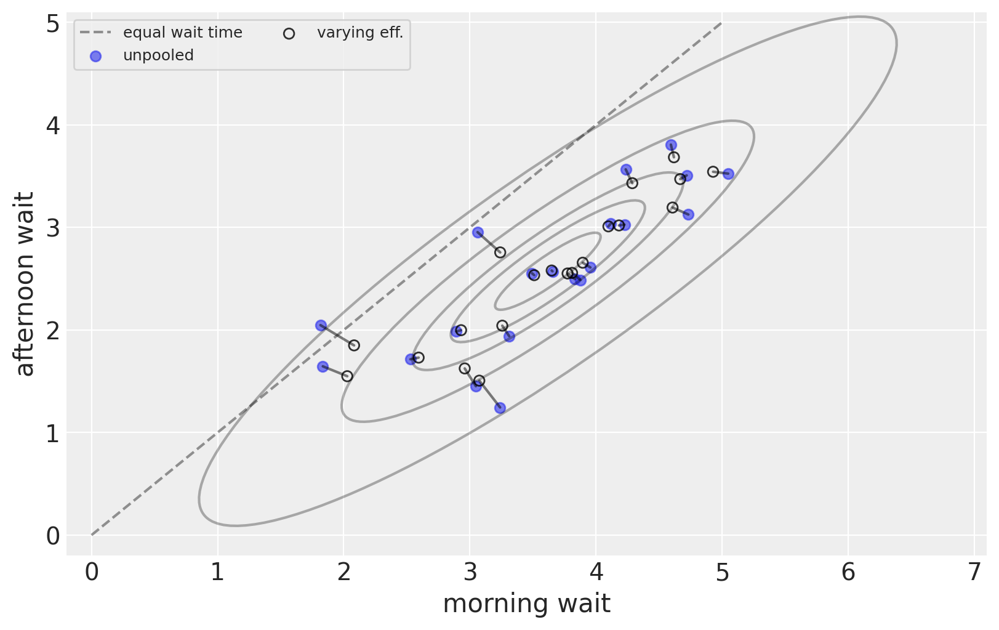

In [24]:
# draw contours
_, ax = plt.subplots(1, 1, figsize=(8, 5))
_ = Gauss2d(
    mu=Mu_est2, cov=np.asarray(Sigma_est2), ci=[0.1, 0.3, 0.5, 0.8, 0.99], ax=ax
)

# plot both and connect with lines
ax.scatter(wait_morning_1, wait_afternoon_1, label="unpooled", alpha=0.6)
ax.scatter(
    wait_morning_2,
    wait_afternoon_2,
    label="varying eff.",
    facecolors="none",
    edgecolors="k",
    lw=1,
    alpha=0.8,
)

ax.plot(
    [wait_morning_1, wait_morning_2],
    [wait_afternoon_1, wait_afternoon_2],
    "k-",
    alpha=0.5,
)
ax.plot(range(6), range(6), "k--", label="equal wait time", alpha=0.4)
ax.set_xlabel("morning wait")
ax.set_ylabel("afternoon wait")
ax.set_xlim(-0.2, 7.1)
ax.set_ylim(-0.2, 5.1)
plt.legend(fontsize=9, ncol=2, loc="upper left", frameon=True);

## 14.2. Advanced varying slopes

$L_i \sim Binomial(1,p_i)$

$logit(p_i) = \gamma_{Tid[i]} + \alpha_{Actor[i],Tid[i]} + \beta_{Block[i],Tid[i]}$

The linear model for $logit(p_i)$ contains an average log-odds for each treatment, $\gamma_{Tid[i]}$, an effect for each actor in each treatment, $\alpha_{Actor[i],Tid[i]}$, and finally an effect for each block in each treatment, $\beta_{Block[i],Tid[i]}$. This is essentially an interaction model that allows the effect of each treatment to vary by each actor and each block. This is to say that the average treatment effect can vary by block, and the each individual chimpanzee can also respond (across blocks) to each treatment differently. This yields a total of 4 + 7 × 4 + 6 × 4 = 56 parameters. Pooling is really needed here. 

### Code 14.18

In [10]:
df = pd.read_csv('Data/chimpanzees.csv', sep=';')

df['treatment'] = df['prosoc_left'] + 2*df['condition']
treatment_id = df['treatment'].values
Ntreatments = len(np.unique(treatment_id))

df['actor'] = df['actor'] - 1
actor_id = df['actor'].astype(int).values
Nactors = len(np.unique(actor_id))

df['block'] = df['block'] - 1
block_id = df['block'].astype(int).values
Nblocks = len(np.unique(block_id))

df.head()

,actor,recipient,condition,block,trial,prosoc_left,chose_prosoc,pulled_left,treatment
0,0,NaN,0,0,2,0,1,0,0
1,0,NaN,0,0,4,0,0,1,0
2,0,NaN,0,0,6,1,0,0,1
3,0,NaN,0,0,8,0,1,0,0
4,0,NaN,0,0,10,1,1,1,1


In [26]:
# define model: pulled_left ~ actor + block + treatment
with pm.Model() as m14_2:   
    
    # fixed priors
    gamma = pm.Normal('gamma', mu=0.0, sd=1.0, shape=Ntreatments)
    chol_actor, _, _ = pm.LKJCholeskyCov('chol_actor', n=Ntreatments, eta=4,
                                         sd_dist=pm.Exponential.dist(1.0),
                                         compute_corr=True)
    chol_block, _, _ = pm.LKJCholeskyCov('chol_block', n=Ntreatments, eta=4, 
                                         sd_dist=pm.Exponential.dist(1.0),
                                         compute_corr=True)

    # adaptive priors
    alpha = pm.MvNormal('alpha', mu=0.0, chol=chol_actor, shape=(Nactors, Ntreatments))
    beta =  pm.MvNormal('beta', mu=0.0, chol=chol_block, shape=(Nblocks, Ntreatments))  
    
    # linear model
    p = pm.math.invlogit(gamma[treatment_id] 
                         + alpha[(actor_id, treatment_id)] 
                         + beta[(block_id, treatment_id)])
    
    # likelihood
    L = pm.Binomial('L', 1, p, observed=df['pulled_left'].values)
    
    trace_m14_2 = pm.sample(1000, tune=1000, target_accept=0.9, random_seed=RANDOM_SEED)
    
    
    # for posterior predictions
    actor = pm.Data("actor", actor_id)
    block = pm.Data("block_id", block_id)
    tid = pm.Data("tid", treatment_id)
    
    idata_m14_2 = az.from_pymc3(trace_m14_2)
    

post = idata_m14_2.posterior = idata_m14_2.posterior.rename_vars(
    {
        "chol_actor_corr": "Rho_actor",
        "chol_actor_stds": "sigma_actor",
        "chol_block_corr": "Rho_block",
        "chol_block_stds": "sigma_block",
    }
)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta, alpha, chol_block, chol_actor, gamma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 148 seconds.
There were 17 divergences after tuning. Increase `target_accept` or reparameterize.
There were 19 divergences after tuning. Increase `target_accept` or reparameterize.
There were 22 divergences after tuning. Increase `target_accept` or reparameterize.
There were 119 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.7658800987431906, but should be close to 0.9. Try to increase the number of tuning steps.
The estimated number of effective samples is smaller than 200 for some parameters.


### Code 14.19

In [5]:
d = pd.read_csv("Data/chimpanzees.csv", sep=";")

d["treatment"] = d.prosoc_left + 2 * d.condition
tid_ = d.treatment.values
Ntreatments = len(np.unique(tid_))

d["actor"] = d.actor - 1
actor_ = d.actor.astype(int).values
Nactors = len(np.unique(actor_))

d["block"] = d.block - 1
block_id_ = d.block.astype(int).values
Nblocks = len(np.unique(block_id_))

In [6]:
# define model: pulled_left ~ actor + block + treatment
with pm.Model() as m14_3:
    # fixed priors
    g = pm.Normal("g", mu=0.0, sd=1.0, shape=Ntreatments)
    sd_dist = pm.Exponential.dist(1.0)
    chol_actor, _, _ = pm.LKJCholeskyCov(
        "chol_actor", n=Ntreatments, eta=4, sd_dist=sd_dist, compute_corr=True
    )
    chol_block, _, _ = pm.LKJCholeskyCov(
        "chol_block", n=Ntreatments, eta=4, sd_dist=sd_dist, compute_corr=True
    )

    # adaptive priors non-centered
    z_actor = pm.Normal("z_actor", 0.0, 1.0, shape=(Ntreatments, Nactors))
    alpha = pm.Deterministic("alpha", pm.math.dot(chol_actor, z_actor))
    z_block = pm.Normal("z_block", 0.0, 1.0, shape=(Ntreatments, Nblocks))
    beta = pm.Deterministic("beta", pm.math.dot(chol_block, z_block))

    # for posterior predictions
    actor = pm.Data("actor", actor_)
    block_id = pm.Data("block_id", block_id_)
    tid = pm.Data("tid", tid_)

    p = pm.Deterministic(
        "p", pm.math.invlogit(g[tid] + alpha[tid, actor] + beta[tid, block_id])
    )
    pulled_left = pm.Binomial("pulled_left", 1, p, observed=d.pulled_left)

    trace_m14_3 = pm.sample(1000, tune=1000, target_accept=0.9, random_seed=RANDOM_SEED)
    idata_m14_3 = az.from_pymc3(trace_m14_3)
post = idata_m14_3.posterior = idata_m14_3.posterior.rename_vars(
    {
        "chol_actor_corr": "Rho_actor",
        "chol_actor_stds": "sigma_actor",
        "chol_block_corr": "Rho_block",
        "chol_block_stds": "sigma_block",
    }
)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [z_block, z_actor, chol_block, chol_actor, g]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 65 seconds.
The acceptance probability does not match the target. It is 0.8202027557668482, but should be close to 0.9. Try to increase the number of tuning steps.
The number of effective samples is smaller than 10% for some parameters.


### Code 14.20

In [29]:
m14_2 = az.summary(idata_m14_2, var_names=['alpha', 'beta'], kind='diagnostics', round_to=2)['ess_mean']
m14_2.name = 'm14_2'

m14_3 = az.summary(idata_m14_3, var_names=['alpha', 'beta'], kind='diagnostics', round_to=2)['ess_mean']
m14_3.name = 'm14_3'

ess_mean = pd.concat([m14_2, m14_3], axis=1, sort=True)

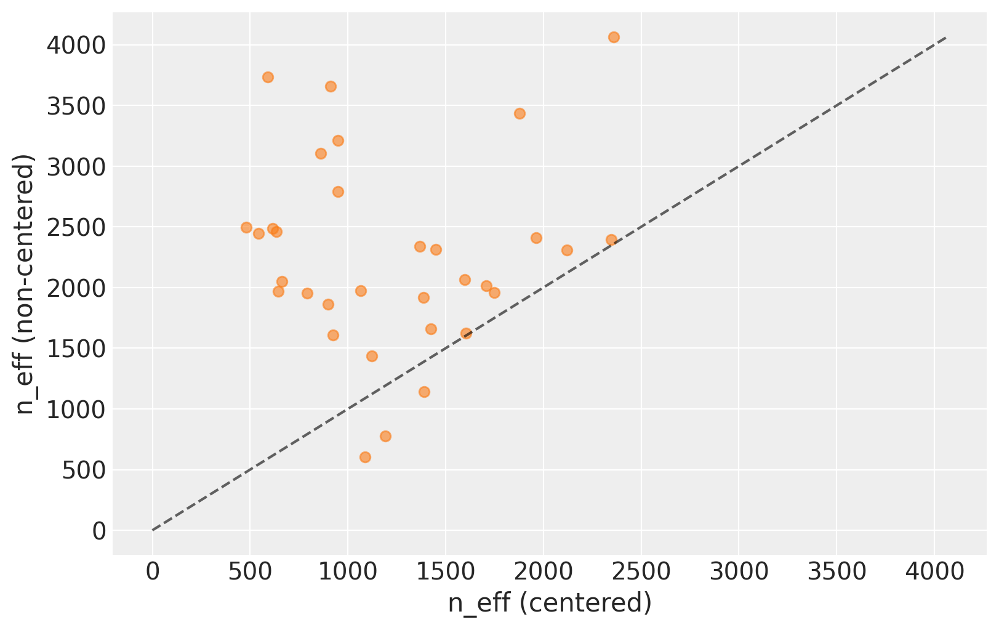

In [30]:
# plot results
fig = plt.figure(figsize=(8, 5))
plt.plot(ess_mean.m14_2.values, ess_mean.m14_3.values, 'C1o', alpha=0.6)
max_val = ess_mean.max().max()
plt.plot(np.arange(max_val), np.arange(max_val), 'k--', alpha=0.6)
plt.ylabel('n_eff (non-centered)', fontsize=15)
plt.xlabel('n_eff (centered)', fontsize=15)
plt.show()

### Code 14.21

In [31]:
# show model summary
varnames = ['sigma_actor','sigma_block']
az.summary(idata_m14_3, varnames, round_to=2, hdi_prob=0.89)

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
sigma_actor[0],1.40,0.49,0.71,2.05,0.01,0.01,1624.24,1624.24,1615.66,2098.78,1.01
sigma_actor[1],0.91,0.41,0.21,1.44,0.01,0.01,1063.20,1063.20,747.31,203.96,1.00
sigma_actor[2],1.89,0.60,1.01,2.82,0.03,0.02,484.66,423.74,666.96,901.28,1.01
sigma_actor[3],1.65,0.68,0.70,2.62,0.03,0.02,706.95,650.31,1005.73,766.74,1.00
sigma_block[0],0.39,0.32,0.00,0.78,0.01,0.01,1641.85,1641.85,1331.84,1152.88,1.00
sigma_block[1],0.43,0.33,0.01,0.82,0.01,0.01,1229.32,1229.32,1072.54,1406.73,1.00
sigma_block[2],0.32,0.29,0.01,0.65,0.01,0.01,522.35,522.35,350.71,189.84,1.01
sigma_block[3],0.49,0.39,0.02,0.98,0.02,0.01,522.95,522.95,471.13,965.93,1.00


In [32]:
# model 


pm.compare({'m14_3': idata_m14_3,
            'm14_2': idata_m14_2}, scale='deviance')

,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
m14_3,0,547.127,27.9104,0,0.608477,19.3968,0,False,deviance
m14_2,1,548.024,28.3041,0.897147,0.391523,19.2816,0.487219,False,deviance


### Code 14.22

In [11]:
# compute mean for each actor in each treatment
pl = df.groupby(["actor", "treatment"]).agg("mean")["pulled_left"].unstack()
pl_val = pl.stack().values
pl

treatment,0,1,2,3
actor,,,,
0,0.333333,0.500000,0.277778,0.555556
1,1.000000,1.000000,1.000000,1.000000
2,0.277778,0.611111,0.166667,0.333333
3,0.333333,0.500000,0.111111,0.444444
4,0.333333,0.555556,0.277778,0.500000
5,0.777778,0.611111,0.555556,0.611111
6,0.777778,0.833333,0.944444,1.000000


In [7]:
# generate posterior predictions
with m14_3:
    pm.set_data(
        {
            "actor": np.repeat(range(7), 4),
            "block_id": np.repeat(4, 4 * 7),
            "tid": list(range(4)) * 7,
        }
    )
    p_post = pm.sample_posterior_predictive(
        trace_m14_3, random_seed=RANDOM_SEED, var_names=["p"]
    )["p"]
p_mu = p_post.mean(0).reshape((7, 4))

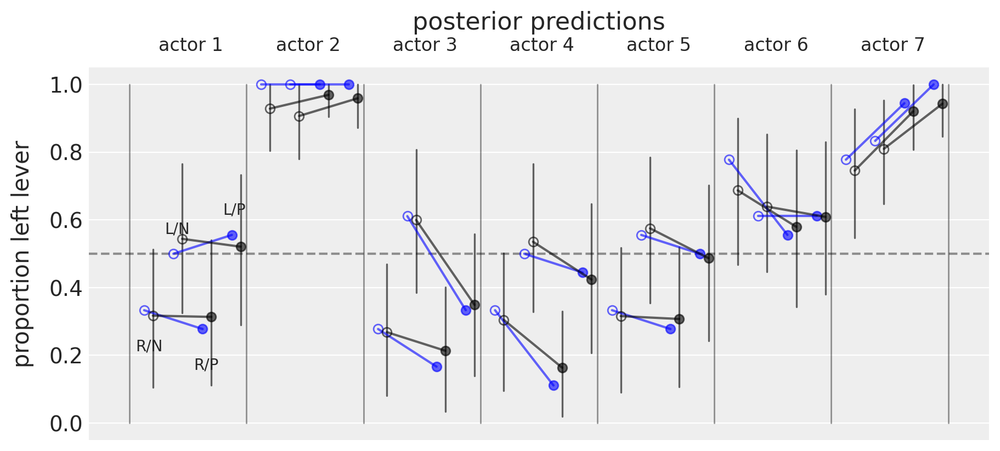

In [12]:
# set up plot
_, ax = plt.subplots(1, 1, figsize=(9, 4), constrained_layout=True)
alpha, xoff, yoff = 0.6, 0.3, 0.06

ax.plot(
    [np.arange(28) + xoff, np.arange(28) + xoff],
    az.hdi(p_post).T,
    "k-",
    lw=1.2,
    alpha=alpha,
)
ax.plot([7 * 4 - 0.5] * 2, [0, 1], c="k", alpha=0.4, lw=1)
ax.axhline(0.5, ls="--", c="k", alpha=0.4)

for actor in range(Nactors):
    # raw data
    ax.plot(
        [actor * 4, actor * 4 + 2],
        [pl.loc[actor, 0], pl.loc[actor, 2]],
        "-",
        c="b",
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + 1, actor * 4 + 3],
        [pl.loc[actor, 1], pl.loc[actor, 3]],
        "-",
        c="b",
        alpha=alpha,
    )
    ax.plot(
        [actor * 4, actor * 4 + 1],
        [pl.loc[actor, 0], pl.loc[actor, 1]],
        "o",
        c="b",
        fillstyle="none",
        ms=6,
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + 2, actor * 4 + 3],
        [pl.loc[actor, 2], pl.loc[actor, 3]],
        "o",
        c="b",
        ms=6,
        alpha=alpha,
    )
    # posterior predictions
    ax.plot(
        [actor * 4 + xoff, actor * 4 + 2 + xoff],
        [p_mu[actor, 0], p_mu[actor, 2]],
        "-",
        c="k",
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + 1 + xoff, actor * 4 + 3 + xoff],
        [p_mu[actor, 1], p_mu[actor, 3]],
        "-",
        c="k",
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + xoff, actor * 4 + 1 + xoff],
        [p_mu[actor, 0], p_mu[actor, 1]],
        "o",
        c="k",
        fillstyle="none",
        ms=6,
        alpha=alpha,
    )
    ax.plot(
        [actor * 4 + 2 + xoff, actor * 4 + 3 + xoff],
        [p_mu[actor, 2], p_mu[actor, 3]],
        "o",
        c="k",
        ms=6,
        alpha=alpha,
    )
    ax.plot([actor * 4 - 0.5] * 2, [0, 1], c="k", alpha=0.4, lw=1)
    ax.text(actor * 4 + 0.5, 1.1, f"actor {actor + 1}", fontsize=12)

    if actor == 0:
        ax.text(actor * 4 - xoff, pl.loc[actor, 0] - 2 * yoff, "R/N")
        ax.text(actor * 4 + 1 - xoff, pl.loc[actor, 1] + yoff, "L/N")
        ax.text(actor * 4 + 2 - xoff, pl.loc[actor, 2] - 2 * yoff, "R/P")
        ax.text(actor * 4 + 3 - xoff, pl.loc[actor, 3] + yoff, "L/P")

ax.set_xticks([])
ax.set_ylabel("proportion left lever", labelpad=10)
ax.set_title("posterior predictions", pad=25);

## 14.3. Instrumental variables and front doors

### 14.3.1. Instrumental variables

### Code 14.23

$W_i \sim Normal(\mu_{W,i}, σ_W)$

$μ_{W,i} = α_w + β_{EW}E_i + U_i$

$E_i \sim Normal(\mu_{E,i}, σ_E)$ 

$μ_{E,i} = α_e + β_{QE}Q_i + U_i$

$Q_i \sim Bernoulli(0.25)$

$U_i \sim Normal(0, 1)$

In [24]:
N = 500
U_sim = np.random.normal(size=N)
Q_sim = np.random.randint(1, 5, N)
E_sim = np.random.normal(loc=U_sim + Q_sim, size=N) #β_QE = 1 
W_sim = np.random.normal(loc=U_sim + 0 * E_sim, size=N) #β_EW = 0

dat_sim = pd.DataFrame.from_dict(
    {'W': preprocessing.scale(W_sim), 'E': preprocessing.scale(E_sim), 'Q': preprocessing.scale(Q_sim)}
)
dat_sim.head()

,W,E,Q
0,-1.101961,0.700839,1.325505
1,-0.223274,-0.709909,-1.394409
2,-0.693501,-1.386435,-1.394409
3,1.748168,0.456972,0.418867
4,-2.055844,0.005816,0.418867


### Code 14.24

In [29]:
# define model: wages ~ education
with pm.Model() as m14_4a:

    # fixed priors
    aW = pm.Normal('aW', mu=0.0, sd=0.2)
    bEW = pm.Normal('bEW', mu=0.0, sd=0.5)
    sigma = pm.Exponential('sigma', 1.0)
    
    # linear model
    mu = pm.Deterministic('mu', aW + bEW*dat_sim['E'].values)
   
    W_obs = pm.Data('W_obs', dat_sim['W'].values)
    
    # likelihood
    W = pm.Normal('W', mu=mu, sd=sigma, observed=W_obs)
  
    trace_m14_4a = pm.sample(1000, tune=1000, target_accept=0.9, random_seed=RANDOM_SEED)
    
    idata_m14_4a = az.from_pymc3(trace_m14_4a)
    
varnames = ['~mu']
az.summary(idata_m14_4a, varnames, kind='stats', round_to=2, hdi_prob=0.89)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bEW, aW]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%
aW,-0.00,0.04,-0.06,0.06
bEW,0.44,0.04,0.38,0.51
sigma,0.90,0.03,0.85,0.94


In [15]:
# define model: wages ~ education
with pm.Model() as m14_4b:

    # fixed priors
    aW = pm.Normal('aW', mu=0.0, sd=0.2)
    bEW = pm.Normal('bEW', mu=0.0, sd=0.5)
    bQW = pm.Normal('bQW', mu=0.0, sd=0.5)
    sigma = pm.Exponential('sigma', 1.0)
    
    # linear model
    mu = pm.Deterministic('mu', aW 
                          + bEW*dat_sim['E'].values 
                          + bQW*dat_sim['Q'].values )
   
    W_obs = pm.Data('W_obs', dat_sim['W'].values)
    
    # likelihood
    W = pm.Normal('W', mu=mu, sd=sigma, observed=W_obs)
  
    trace_m14_4b = pm.sample(1000, tune=1000, target_accept=0.9, random_seed=RANDOM_SEED)
    
    idata_m14_4b = az.from_pymc3(trace_m14_4b)
    
varnames = ['~mu']
az.summary(idata_m14_4b, varnames, kind='stats', round_to=2, hdi_prob=0.89)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bQW, bEW, aW]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%
aW,0.00,0.04,-0.06,0.06
bEW,0.60,0.05,0.52,0.68
bQW,-0.34,0.05,-0.42,-0.27
sigma,0.88,0.03,0.83,0.92


In [16]:
# define model: wages ~ education
with pm.Model() as m14_4a:

    # fixed priors
    aW = pm.Normal('aW', mu=0.0, sd=0.2)
    bEW = pm.Normal('bEW', mu=0.0, sd=0.5)
    sigma = pm.Exponential('sigma', 1.0)
    
    # linear model
    mu = pm.Deterministic('mu', aW + bEW*dat_sim['E'].values)
   
    # likelihood
    W = pm.Normal("pulled_left", mu=mu, sd=sigma, observed=dat_sim['W'].values)
  
    trace_m14_4a = pm.sample(1000, tune=1000, target_accept=0.9, random_seed=RANDOM_SEED)
    
    idata_m14_4a = az.from_pymc3(trace_m14_4a)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bEW, aW]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


**Multivariate Linear Model**, a regression with multiple simultaneous outcomes, all modeled with a joint error structure.

### Code 14.25

In [25]:
# define model: wages ~ education + Q
with pm.Model() as m14_5:

    # fixed priors
    aW = pm.Normal('aW', mu=0.0, sd=0.2)
    aE = pm.Normal('aE', mu=0.0, sd=0.2)
    bEW = pm.Normal('bEW', mu=0.0, sd=0.5)
    bQE = pm.Normal('bQE', mu=0.0, sd=0.5)
    sigma = pm.Exponential('sigma', 1.0)
    chol, _, _ = pm.LKJCholeskyCov('chol_cov', n=2, eta=2, 
                                   sd_dist=pm.Exponential.dist(1.0), 
                                   compute_corr=True)
        
    # linear model
    muW = pm.Deterministic('muW', aW + bEW*dat_sim['E'].values)
    muE = pm.Deterministic('muE', aE + bQE*dat_sim['Q'].values)
    
    WE_obs = pm.Data('WE_obs', dat_sim[['W', 'E']].values)
    
    # likelihood
    WE = pm.MvNormal('WE', mu=tt.stack([muW, muE]).T, chol=chol, 
                          shape=(N, 2), 
                          observed=WE_obs) 
    
    trace_m14_5 = pm.sample(1000, tune=1000, target_accept=0.9, random_seed=RANDOM_SEED)
        
    idata_m14_5 = az.from_pymc3(trace_m14_5,
        dims={'chol_cov_stds': ['variable']},
        coords={'variable': ['Wages', 'Education']})

    idata_m14_5.posterior = idata_m14_5.posterior.rename_vars({"chol_cov_corr": "Rho", 
                                                               "chol_cov_stds": "Sigma"})

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [chol_cov, sigma, bQE, bEW, aE, aW]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 10 seconds.


In [26]:
varnames = ['~muW','~muE','~chol_cov']
az.summary(idata_m14_5, varnames, kind='stats', round_to=2, hdi_prob=0.89)

,mean,sd,hdi_5.5%,hdi_94.5%
aW,0.00,0.04,-0.07,0.07
aE,0.00,0.04,-0.06,0.05
bEW,0.07,0.07,-0.05,0.19
bQE,0.59,0.04,0.53,0.65
sigma,0.98,0.97,0.00,2.21
Sigma[0],0.98,0.04,0.91,1.04
Sigma[1],0.81,0.03,0.77,0.85
"Rho[0,0]",1.00,0.00,1.00,1.00
"Rho[0,1]",0.48,0.06,0.38,0.57
"Rho[1,0]",0.48,0.06,0.38,0.57


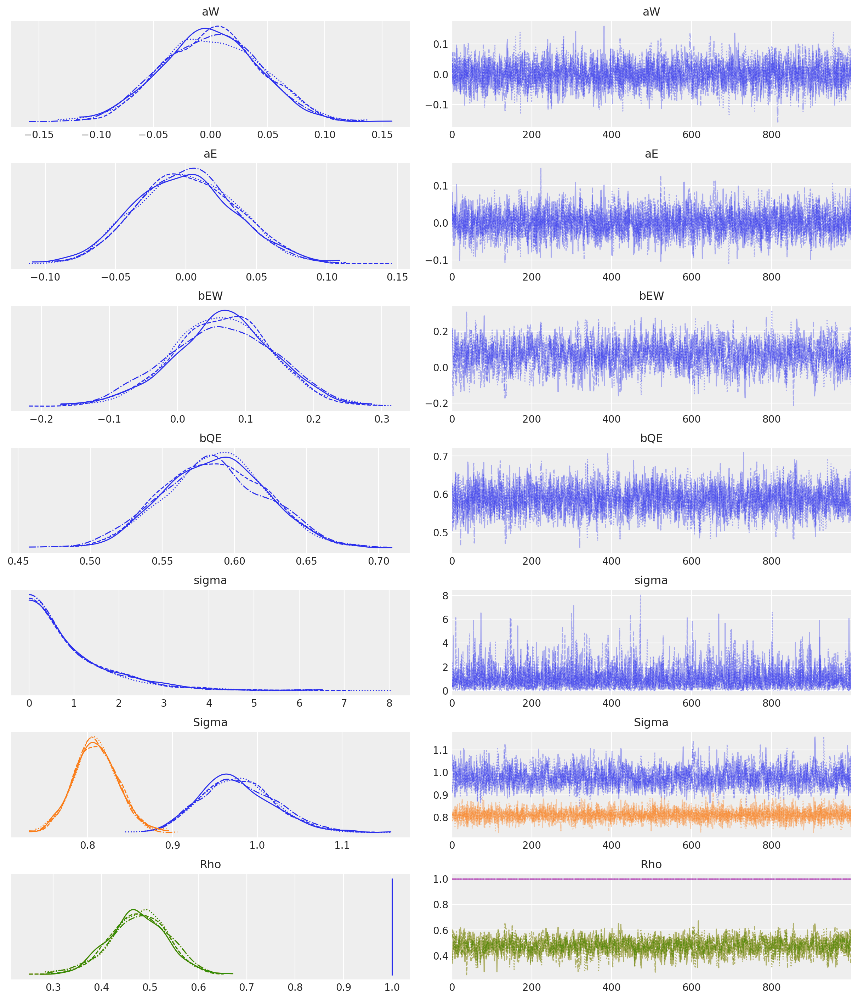

In [27]:
az.plot_trace(idata_m14_5, var_names=['~muW','~muE','~chol_cov'], compact=True);

### Code 14.26

In [30]:
with m14_4a:
    pm.set_data({'W_obs': dat_sim['W'].values})  # replace `dat_sim.W` with new obs
    trace_14_4x = pm.sample(random_seed=RANDOM_SEED)

with m14_5:
    pm.set_data({'WE_obs': dat_sim[["W", "E"]].values})  # replace `dat_sim[["W", "E"]].values` with new obs
    trace_14_5x = pm.sample(2000, random_seed=RANDOM_SEED)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bEW, aW]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [chol_cov, sigma, bQE, bEW, aE, aW]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 13 seconds.


### Code 14.27

In [32]:
N = 500
U_sim = np.random.normal(size=N)
Q_sim = np.random.randint(1, 5, N)
E_sim = np.random.normal(loc=U_sim + Q_sim, size=N)
W_sim = np.random.normal(loc=-U_sim + 0.2 * E_sim, size=N)

dat_sim2 = pd.DataFrame.from_dict(
    {'W': preprocessing.scale(W_sim), 'E': preprocessing.scale(E_sim), 'Q': preprocessing.scale(Q_sim)}
)
dat_sim2.head()

,W,E,Q
0,0.008647,0.701616,0.385599
1,0.882751,-0.614048,-1.424727
2,0.161271,-0.169622,-0.519564
3,0.489192,0.178893,-1.424727
4,-1.073461,0.449143,0.385599


In [33]:
with m14_4a:
    pm.set_data({'W_obs': dat_sim2['W']})
    trace_m14_4x = pm.sample(random_seed=RANDOM_SEED)
    idata_m14_4x = az.from_pymc3(trace_14_4x)

varnames = ['~mu']
az.summary(idata_m14_4x, varnames, kind='stats', round_to=2, hdi_prob=0.89)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, bEW, aW]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%
aW,0.00,0.04,-0.06,0.06
bEW,0.44,0.04,0.38,0.51
sigma,0.90,0.03,0.85,0.94


In [34]:
with m14_5:
    pm.set_data({'WE_obs': dat_sim2[['W', 'E']].values})
    trace_m14_5x = pm.sample(random_seed=RANDOM_SEED)
    
    idata_m14_5x = az.from_pymc3(trace_m14_5x,
                                dims={'chol_cov_stds': ['variable']},
                                coords={'variable': ['Wages', 'Education']})

    idata_m14_5x.posterior = idata_m14_5x.posterior.rename_vars({"chol_cov_corr": "Rho", 
                                                               "chol_cov_stds": "Sigma"})
    
varnames = ['~muW','~muE','~chol_cov']
az.summary(idata_m14_5x, varnames, kind='stats', round_to=2, hdi_prob=0.89)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [chol_cov, sigma, bQE, bEW, aE, aW]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 8 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.


,mean,sd,hdi_5.5%,hdi_94.5%
aW,0.00,0.04,-0.07,0.07
aE,0.00,0.04,-0.07,0.07
bEW,0.04,0.04,-0.03,0.11
bQE,-0.04,0.04,-0.11,0.03
sigma,1.01,1.03,0.00,2.17
Sigma[0],1.00,0.03,0.96,1.06
Sigma[1],1.00,0.03,0.95,1.05
"Rho[0,0]",1.00,0.00,1.00,1.00
"Rho[0,1]",-0.19,0.04,-0.26,-0.12
"Rho[1,0]",-0.19,0.04,-0.26,-0.12


### Code 4.28

Using [`causalgraphicalmodels`](https://github.com/ijmbarr/causalgraphicalmodels) for graph drawing and analysis instead of `dagitty`, following the example of [fehiepsi's NumPyro version of Rethinking](https://github.com/fehiepsi/rethinking-numpyro).

In [35]:
from causalgraphicalmodels import CausalGraphicalModel

dagIV = CausalGraphicalModel(
    nodes=["E", "W", "U", "Q"], edges=[("E", "W"), ("U", "E"), ("U", "W"), ("Q", "E")]
)

for s in dagIV.observed_variables:
    if s in ["E", "W"]:
        continue
    cond1 = not dagIV.is_d_separated(s, "E")
    cond2 = dagIV.do("E").is_d_separated(s, "W")
    if cond1 and cond2:
        print(s)

Q


### 14.3.2. Front-door criterion

A nother example for deconfounding is to use a mediator variable and the **front-door criterion**. 

An exposure of interest X influences a mediator Z which influences the outcome of interest Y. But X and Y are confounded by the unobserved U. There is a backdoor from X to Y through U, so regressing Y on X won’t work. What can we do?

We can go through the front door. This means using the combination of the paths X → Z and Z → Y to infer the total causal influence of X on Y. Consider the extreme case in which Z has zero influence on Y. In that case, no matter how strong the path X → Z, there is no causal influence of X on Y. In less extreme cases, if we combine the strength of both X → Z and Z → Y in the right way, we can get a valid estimate. In simple cases, there is actually a formula for this. But we want the entire posterior distribution. So let’s again leverage our Bayesian strategy of not being clever. Instead of being clever, we’ll just write down the generative model and then write a statistical model that corresponds to it. Probability theory can do the rest—once we’ve done the hard work of building a trustworthy DAG and making quality measurements that is.

## 14.4. Social relations as correlated varying effects

### Code 14.29

In [18]:
kl_dyads = pd.read_csv("Data/KosterLeckie.csv")
kl_dyads

,hidA,hidB,did,giftsAB,giftsBA,offset,drel1,drel2,drel3,drel4,dlndist,dass,d0125
0,1,2,1,0,4,0.000,0,0,1,0,-2.790,0.000,0
1,1,3,2,6,31,-0.003,0,1,0,0,-2.817,0.044,0
2,1,4,3,2,5,-0.019,0,1,0,0,-1.886,0.025,0
3,1,5,4,4,2,0.000,0,1,0,0,-1.892,0.011,0
4,1,6,5,8,2,-0.003,1,0,0,0,-3.499,0.022,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,22,24,296,0,1,0.000,0,0,1,0,-2.442,0.000,0
296,22,25,297,2,0,-0.637,0,0,0,1,-1.747,0.026,0
297,23,24,298,2,0,-0.092,0,0,0,0,-1.798,0.000,0
298,23,25,299,4,0,-0.818,0,0,1,0,-1.848,0.031,0


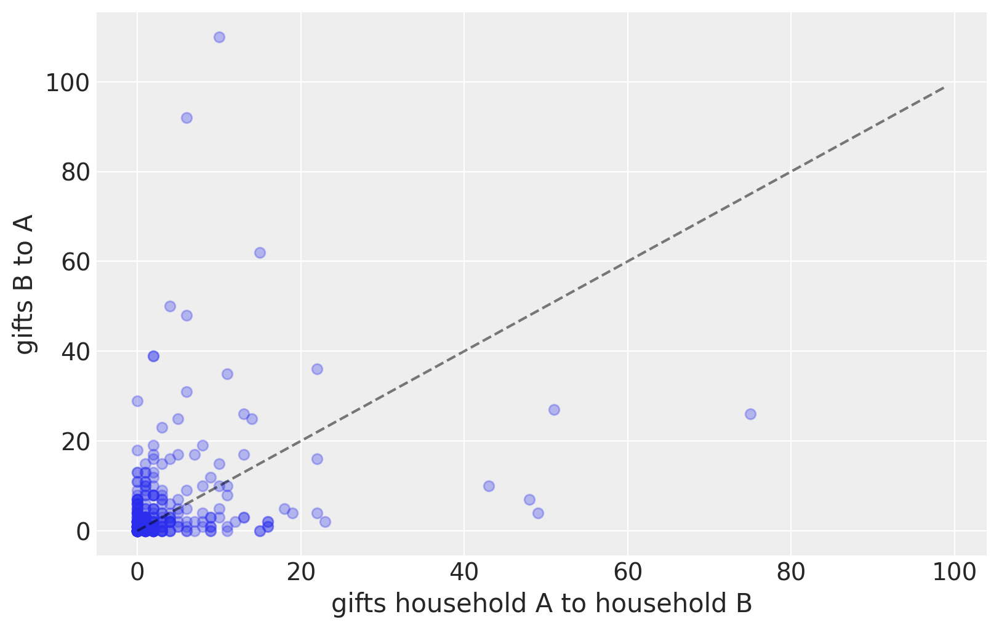

In [19]:
# plot height and weight against one another
fig = plt.figure(figsize=(8, 5))
plt.plot(kl_dyads.giftsAB, kl_dyads.giftsBA, 'o', alpha=0.3)
plt.plot(range(100), range(100), "k--", lw=1.5, alpha=0.5)
plt.xlabel('gifts household A to household B', fontsize=15)
plt.ylabel('gifts B to A', fontsize=15)
plt.show()

In [20]:
from scipy.stats import pearsonr
corr, _ = pearsonr(kl_dyads.giftsAB, kl_dyads.giftsBA)
corr.round(2)

0.24

In order to statistically separate balanced exchange from generalized differences in giving and receiving, we need a model that treats these as separate. The type of model we’ll consider is often called a **social relations model**, or SRM.

$y_{A→B} \sim Poisson(λ_{AB})$


$log(λ_{AB}) = α + g_A +r_B +d_{AB}$

The linear model has an intercept $α$ that represent the average gifting rate (on the log scale) across all dyads. The other effects will be offsets from this average. Then $g_A$ is a varying effect parameter for the generalized giving tendency of household A, regardless of dyad. The effect $r_B$ is the generalized receiving of household B, regardless of dyad. Finally the effect $d_{AB}$ is the dyad-specific rate that A gives to B.

direction within the same dyad:

$y_{B→A} \sim Poisson(λ_{BA})$


$log(λ_{BA}) = α + g_B +r_A +d_{BA}$

### Code 14.30

In [21]:
N = len(kl_dyads)
N_households = kl_dyads.hidB.max()
did = (kl_dyads.did - 1).values
hidA = (kl_dyads.hidA - 1).values
hidB = (kl_dyads.hidB - 1).values

In [22]:
with pm.Model() as m14_6:
    
    # fixed priors
    a = pm.Normal('a', mu=0.0, sd=1.0)
    
    # gr matrix of varying effects
    chol_gr, _, _ = pm.LKJCholeskyCov('chol_gr', n=2, eta=4, 
                                   sd_dist=pm.Exponential.dist(1.0), 
                                   compute_corr=True)
    gr = pm.MvNormal('gr', mu=0.0, chol=chol_gr, shape=(N_households, 2)) 
    
    # dyad effects
    chol_d, _, _ = pm.LKJCholeskyCov('chol_d', n=2, eta=8, 
                                   sd_dist=pm.Exponential.dist(1.0), 
                                   compute_corr=True)
    z = pm.Normal('z', mu=0.0, sd=1.0, shape=(2, N))
    d = pm.Deterministic('d', pm.math.dot(chol_d, z).T)
    
    # linear model
    lambdaAB = pm.math.exp(a + gr[hidA, 0] + gr[hidB, 1] + d[did, 0])
    lambdaBA = pm.math.exp(a + gr[hidB, 0] + gr[hidA, 1] + d[did, 1])

    # likelihood
    giftsAB = pm.Poisson('giftsAB', lambdaAB, observed=kl_dyads.giftsAB)
    giftsBA = pm.Poisson('giftsBA', lambdaBA, observed=kl_dyads.giftsBA)
    
    trace_m14_6 = pm.sample(2000, tune=3000, random_seed=RANDOM_SEED)
    idata_m14_6 = az.from_pymc3(trace_m14_6,
                               dims={"d": ["Dyad", "House"], "gr": ["Household", "Rate"]},
                               coords={"Rate": ["giving", "receiving"]})

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [z, chol_d, gr, chol_gr, a]


Sampling 4 chains for 3_000 tune and 2_000 draw iterations (12_000 + 8_000 draws total) took 168 seconds.
The number of effective samples is smaller than 25% for some parameters.


In [23]:
post = idata_m14_6.posterior = idata_m14_6.posterior.rename_vars(
    {
        "chol_gr_corr": "Rho_gr",
        "chol_gr_stds": "sigma_gr",
        "chol_d_corr": "Rho_d",
        "chol_d_stds": "sigma_d",
    }
)

In [24]:
az.summary(idata_m14_6, var_names=["Rho_gr", "sigma_gr"], round_to=2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
"Rho_gr[0,0]",1.00,0.00,1.00,1.00,0.0,0.0,8000.00,8000.00,8000.00,8000.00,NaN
"Rho_gr[0,1]",-0.41,0.20,-0.77,-0.03,0.0,0.0,3059.12,3028.81,2998.32,4303.72,1.0
"Rho_gr[1,0]",-0.41,0.20,-0.77,-0.03,0.0,0.0,3059.12,3028.81,2998.32,4303.72,1.0
"Rho_gr[1,1]",1.00,0.00,1.00,1.00,0.0,0.0,8000.00,8000.00,7907.96,7996.59,1.0
sigma_gr[0],0.83,0.14,0.58,1.08,0.0,0.0,4676.14,4429.55,4956.66,4997.23,1.0
sigma_gr[1],0.42,0.09,0.25,0.59,0.0,0.0,2311.25,2311.25,2246.46,3999.40,1.0


### Code 14.32

In [25]:
g = (post["a"] + post["gr"].sel(Rate="giving")).stack(sample=("chain", "draw"))
r = (post["a"] + post["gr"].sel(Rate="receiving")).stack(sample=("chain", "draw"))
Eg_mu = np.exp(g).mean(dim="sample")
Er_mu = np.exp(r).mean(dim="sample")

### Code 14.33

Adapted from [fehiepsi's port](https://fehiepsi.github.io/rethinking-numpyro/14-adventures-in-covariance.html#Code-14.34) of _Rethinking_ to NumPyro:

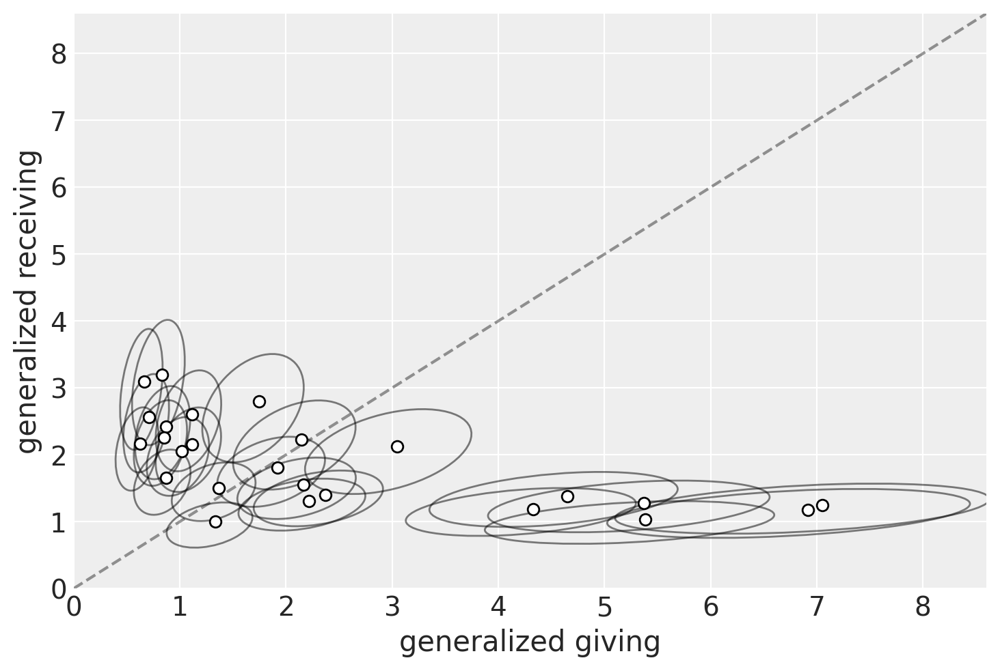

In [26]:
_, ax = plt.subplots(1, 1, constrained_layout=True)
x = np.linspace(0, 9, 101)
ax.plot(x, x, "k--", lw=1.5, alpha=0.4)

# ellipses
for house in range(25):
    Sigma = np.cov(np.stack([np.exp(g[house].values), np.exp(r[house].values)]))
    Mu = np.stack([np.exp(g[house].values.mean()), np.exp(r[house].values.mean())])

    pearson = Sigma[0, 1] / np.sqrt(Sigma[0, 0] * Sigma[1, 1])
    ellipse = Ellipse(
        (0, 0),
        np.sqrt(1 + pearson),
        np.sqrt(1 - pearson),
        edgecolor="k",
        alpha=0.5,
        facecolor="none",
    )
    std_dev = stats.norm.ppf((1 + np.sqrt(0.5)) / 2)
    scale_x = 2 * std_dev * np.sqrt(Sigma[0, 0])
    scale_y = 2 * std_dev * np.sqrt(Sigma[1, 1])
    scale = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y)
    ellipse.set_transform(scale.translate(Mu[0], Mu[1]) + ax.transData)
    ax.add_patch(ellipse)

# household means
ax.plot(Eg_mu, Er_mu, "ko", mfc="white", lw=1.5)

ax.set(
    xlim=(0, 8.6),
    ylim=(0, 8.6),
    xlabel="generalized giving",
    ylabel="generalized receiving",
);

### Code 14.34

In [27]:
az.summary(idata_m14_6, var_names=["Rho_d", "sigma_d"], round_to=2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
"Rho_d[0,0]",1.00,0.00,1.00,1.00,0.0,0.0,8000.00,8000.00,8000.00,8000.00,NaN
"Rho_d[0,1]",0.88,0.03,0.81,0.94,0.0,0.0,2265.85,2265.85,2331.23,3670.92,1.0
"Rho_d[1,0]",0.88,0.03,0.81,0.94,0.0,0.0,2265.85,2265.85,2331.23,3670.92,1.0
"Rho_d[1,1]",1.00,0.00,1.00,1.00,0.0,0.0,8000.00,8000.00,7880.74,7503.08,1.0
sigma_d[0],1.07,0.07,0.95,1.20,0.0,0.0,2840.15,2840.15,2832.24,4698.61,1.0
sigma_d[1],1.12,0.07,1.00,1.25,0.0,0.0,3094.41,3080.74,3111.75,4404.23,1.0


### Code 14.35

In [28]:
dy1 = post["d"].sel(House=0).mean(dim=("chain", "draw"))
dy2 = post["d"].sel(House=1).mean(dim=("chain", "draw"))

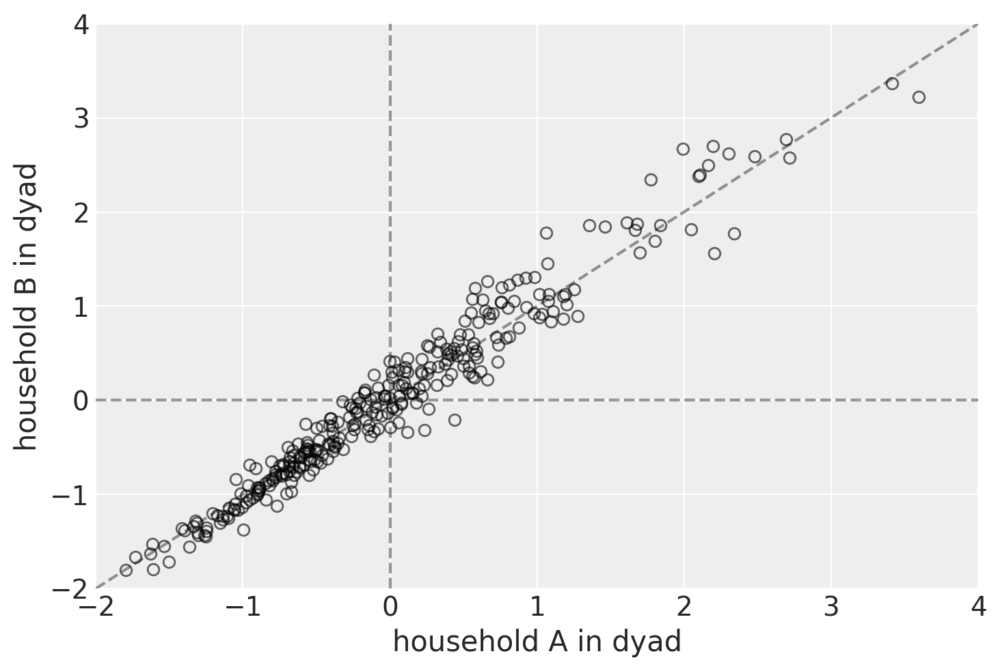

In [29]:
_, ax = plt.subplots(1, 1, constrained_layout=True)
x = np.linspace(-2, 4, 101)

ax.plot(x, x, "k--", lw=1.5, alpha=0.4)
ax.axhline(linewidth=1.5, color="k", ls="--", alpha=0.4)
ax.axvline(linewidth=1.5, color="k", ls="--", alpha=0.4)
ax.plot(dy1, dy2, "ko", mfc="none", lw=1.5, alpha=0.6)

ax.set(
    xlim=(-2, 4),
    ylim=(-2, 4),
    xlabel="household A in dyad",
    ylabel="household B in dyad",
);

## 14.5. Continuous categories and the Gaussian process

Luckily, there is a way to apply the varying effects approach to continuous categories of this kind. This will allow us to estimate a unique intercept (or slope) for any age, while still regarding age as a continuous dimension in which similar ages have more similar intercepts (or slopes). The general approach is known as **Gaussian process regression**.

### 14.5.1. Example: Spatial autocorrelation in Oceanic tools

### Code 14.36

In [6]:
Dmat = pd.read_csv("Data/islandsDistMatrix.csv", sep=",", index_col=0)
Dmat.round(1)

,Ml,Ti,SC,Ya,Fi,Tr,Ch,Mn,To,Ha
Malekula,0.0,0.5,0.6,4.4,1.2,2.0,3.2,2.8,1.9,5.7
Tikopia,0.5,0.0,0.3,4.2,1.2,2.0,2.9,2.7,2.0,5.3
Santa Cruz,0.6,0.3,0.0,3.9,1.6,1.7,2.6,2.4,2.3,5.4
Yap,4.4,4.2,3.9,0.0,5.4,2.5,1.6,1.6,6.1,7.2
Lau Fiji,1.2,1.2,1.6,5.4,0.0,3.2,4.0,3.9,0.8,4.9
Trobriand,2.0,2.0,1.7,2.5,3.2,0.0,1.8,0.8,3.9,6.7
Chuuk,3.2,2.9,2.6,1.6,4.0,1.8,0.0,1.2,4.8,5.8
Manus,2.8,2.7,2.4,1.6,3.9,0.8,1.2,0.0,4.6,6.7
Tonga,1.9,2.0,2.3,6.1,0.8,3.9,4.8,4.6,0.0,5.0
Hawaii,5.7,5.3,5.4,7.2,4.9,6.7,5.8,6.7,5.0,0.0


$Ti ∼ Poisson(λ_i)$ 

$λ_i = αP^β_i /γ$

We’d like to have these λ values adjusted by a varying intercept parameter. We could just add the intercept to the expression above, but then λi might end up negative. So instead let’s make the varying intercepts multiplicative

$Ti ∼ Poisson(λ_i)$ 

$λ_i = exp(k_{Society[i]})αP^β_i /γ$

### Code 14.37

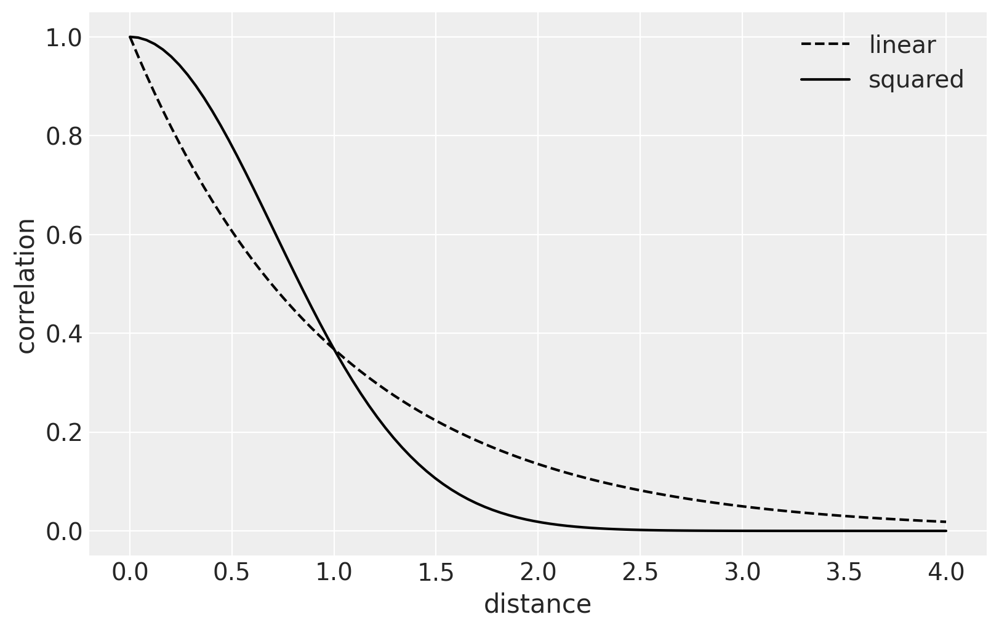

In [7]:
_, ax = plt.subplots(1, 1, figsize=(8, 5))

xrange = np.linspace(0, 4, 100)
# linear
ax.plot(xrange, np.exp(-1 * xrange), "k--", label="linear")
# squared
ax.plot(xrange, np.exp(-1 * xrange ** 2), "k", label="squared")

ax.set_xlabel("distance")
ax.set_ylabel("correlation")
plt.legend();

### Code 14.38

$Ti ∼ Poisson(λ_i)$ 

$λ_i = exp(k_{Society[i]})αP^β_i /γ$

$k ∼ MVNormal((0,\cdots,0), \mathbf{K})$

$\mathbf{K}_ij =  η^2exp(−ρ^2D^2_{ij}) + δ_{ij}(0.01)$

$α ∼ Exponential(1)$

$β ∼ Exponential(1) $

$η^2 ∼ Exponential(2) $

$ρ^2 ∼ Exponential(0.5)$



In [12]:
# load the ordinary data, now with coordinates
dk = pd.read_csv("Data/Kline2.csv", sep=",")

Nsociety = dk.shape[0]
society = np.arange(Nsociety)
total_tools = dk.total_tools.values

Dmat = Dmat.values
Dmatsq = np.power(Dmat, 2)

P = preprocessing.scale(np.log(dk.population.values))
P = P + np.abs(P.min()) + 0.1  # must be > 0, see chp 11

dk

,culture,population,contact,total_tools,mean_TU,lat,lon,lon2,logpop
0,Malekula,1100,low,13,3.2,-16.3,167.5,-12.5,7.003065
1,Tikopia,1500,low,22,4.7,-12.3,168.8,-11.2,7.313220
2,Santa Cruz,3600,low,24,4.0,-10.7,166.0,-14.0,8.188689
3,Yap,4791,high,43,5.0,9.5,138.1,-41.9,8.474494
4,Lau Fiji,7400,high,33,5.0,-17.7,178.1,-1.9,8.909235
5,Trobriand,8000,high,19,4.0,-8.7,150.9,-29.1,8.987197
6,Chuuk,9200,high,40,3.8,7.4,151.6,-28.4,9.126959
7,Manus,13000,low,28,6.6,-2.1,146.9,-33.1,9.472705
8,Tonga,17500,high,55,5.4,-21.2,-175.2,4.8,9.769956
9,Hawaii,275000,low,71,6.6,19.9,-155.6,24.4,12.524526


In [14]:
with pm.Model() as m14_7:
    
    # fixed priors
    a = pm.Exponential('a', 1.0)
    b = pm.Exponential('b', 1.0)
    g = pm.Exponential('g', 1.0)
    etasq = pm.Exponential('etasq', 2.0)
    ls_inv = pm.HalfNormal("ls_inv", 2.0)
    rhosq = pm.Deterministic("rhosq", 0.5 * ls_inv ** 2)
    
    # Implementation with PyMC's GP module:
    cov = etasq * pm.gp.cov.ExpQuad(input_dim=1, ls_inv=ls_inv)
    gp = pm.gp.Latent(cov_func=cov)
    K = gp.prior("K", X=Dmat)
    
    # linear model
    lam = (a * P ** b / g) * tt.exp(K[society])
    
    # likelihood
    T = pm.Poisson('T', mu = lam, observed=total_tools)
    
    trace_m14_7 = pm.sample(4000, tune=2000, target_accept=0.99, random_seed=RANDOM_SEED)
    idata_m14_7 = az.from_pymc3(trace_m14_7,
                               dims={"K": ["society"]})

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [K_rotated_, ls_inv, etasq, g, b, a]


Sampling 4 chains for 2_000 tune and 4_000 draw iterations (8_000 + 16_000 draws total) took 548 seconds.
The number of effective samples is smaller than 10% for some parameters.


### Code 14.39

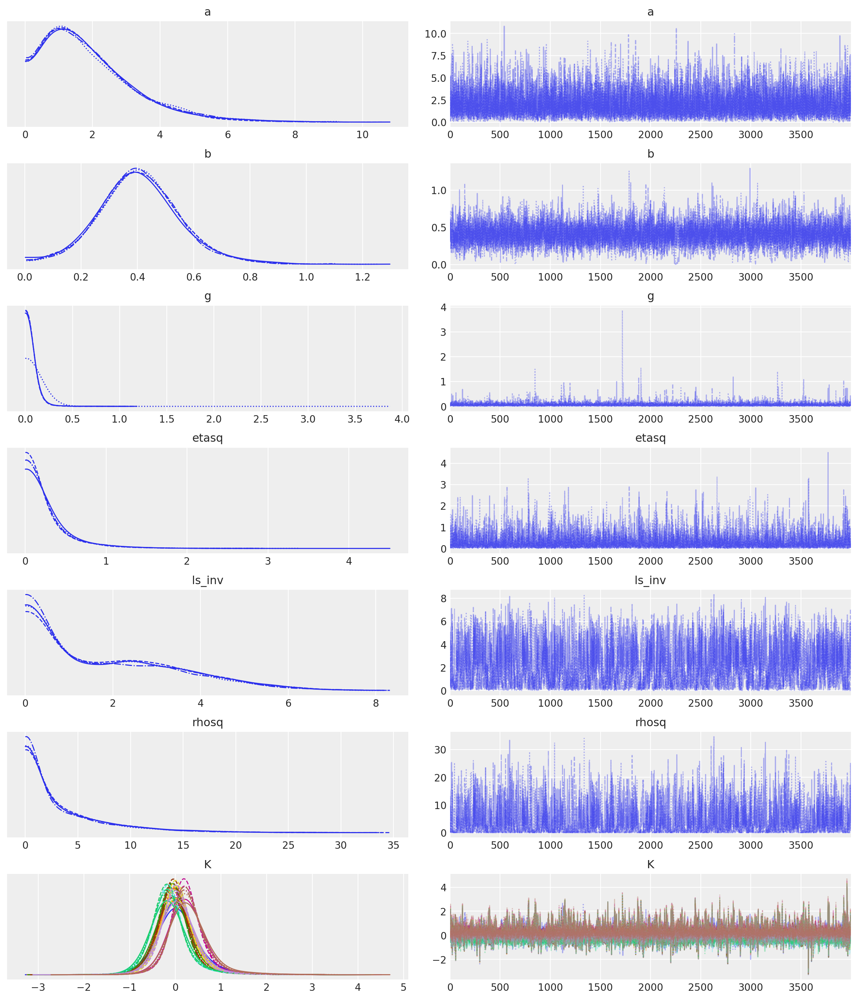

In [15]:
az.plot_trace(idata_m14_7, var_names=["~K_rotated_"], compact=True);

In [16]:
az.summary(idata_m14_7, var_names=["~K_rotated_"], round_to=2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a,1.92,1.37,0.04,4.41,0.01,0.01,11336.91,11336.91,8549.55,6372.86,1.0
b,0.41,0.14,0.14,0.69,0.00,0.00,5254.21,5254.21,5124.03,2618.91,1.0
g,0.07,0.08,0.00,0.17,0.00,0.00,7441.67,7441.67,7704.52,6216.60,1.0
etasq,0.27,0.31,0.00,0.81,0.00,0.00,6676.02,6676.02,5898.02,7899.07,1.0
ls_inv,1.92,1.62,0.00,4.79,0.05,0.03,1178.79,1178.79,1127.23,3472.15,1.0
rhosq,3.16,4.38,0.00,11.46,0.10,0.07,1833.45,1833.45,1127.23,3472.15,1.0
K[0],0.05,0.46,-0.77,0.96,0.01,0.00,7603.15,6584.31,7214.18,7889.14,1.0
K[1],0.01,0.41,-0.73,0.76,0.00,0.00,9344.18,5590.15,9658.69,7370.97,1.0
K[2],-0.05,0.39,-0.77,0.65,0.00,0.00,8226.84,5350.63,9686.58,5667.12,1.0
K[3],0.24,0.40,-0.49,0.94,0.00,0.00,9757.67,5717.12,10356.49,6596.97,1.0


### Code 14.40

In [17]:
# compute posterior median covariance
x_seq = np.linspace(0, 10, 100)
post = idata_m14_7.posterior.stack(sample=("chain", "draw"))
pmcov_mu = post["etasq"].median().values * np.exp(
    -post["rhosq"].median().values * (x_seq ** 2)
)

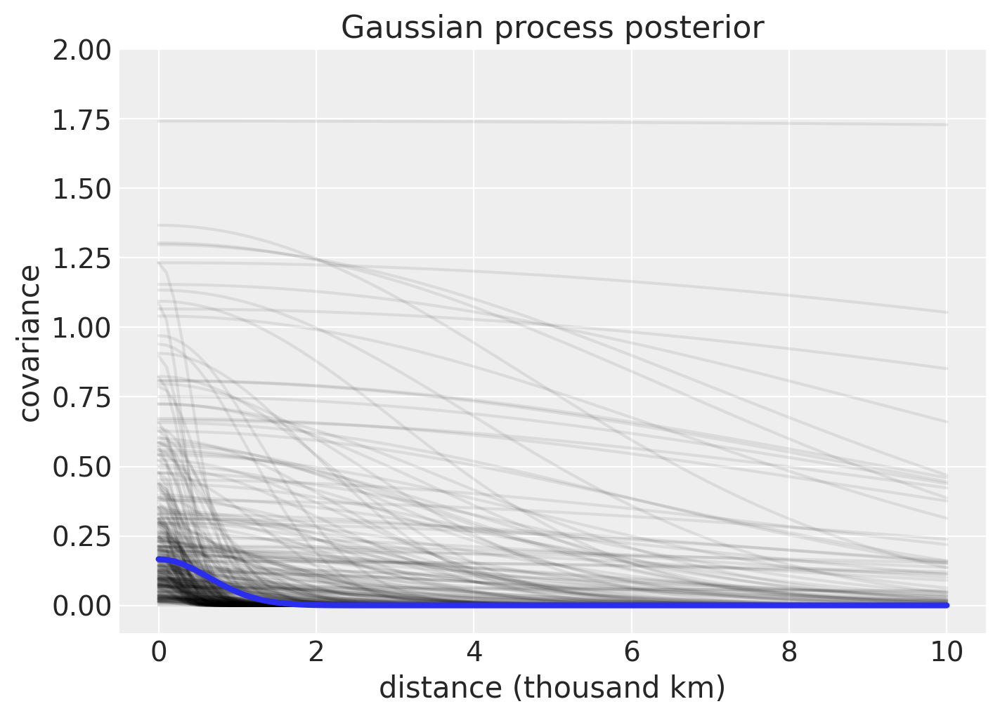

In [18]:
_, ax = plt.subplots(1, 1, figsize=(7, 5))

# plot functions sampled from posterior
ax.plot(
    x_seq,
    (
        post["etasq"][::50].values[:, None]
        * np.exp(-post["rhosq"][::50].values[:, None] * (x_seq ** 2))
    ).T,
    "k",
    alpha=0.08,
)

# plot median covariance function
ax.plot(x_seq, pmcov_mu, lw=3)

ax.set(
    title="Gaussian process posterior",
    ylim=(-0.1, 2),
    xlabel="distance (thousand km)",
    ylabel="covariance",
);

### Code 14.41

In [19]:
# compute posterior median covariance among societies
K = post["etasq"].median().values * np.exp(-post["rhosq"].median().values * Dmatsq) 
+ np.diag([0.01] * Nsociety)

array([[0.01, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.01, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.01, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.01, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.01, 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.01, 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.01, 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.01, 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.01, 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.01]])

### Code 14.42

In [20]:
# convert to correlation matrix
sigma_post = np.sqrt(np.diag(K))
Rho = (sigma_post ** -1) * K * (sigma_post ** -1)

# add row/col names for convenience
Rho = pd.DataFrame(
    Rho,
    index=["Ml", "Ti", "SC", "Ya", "Fi", "Tr", "Ch", "Mn", "To", "Ha"],
    columns=["Ml", "Ti", "SC", "Ya", "Fi", "Tr", "Ch", "Mn", "To", "Ha"],
)

Rho.round(2)

,Ml,Ti,SC,Ya,Fi,Tr,Ch,Mn,To,Ha
Ml,1.00,0.75,0.61,0.00,0.15,0.01,0.00,0.00,0.01,0.0
Ti,0.75,1.00,0.88,0.00,0.15,0.01,0.00,0.00,0.01,0.0
SC,0.61,0.88,1.00,0.00,0.05,0.03,0.00,0.00,0.00,0.0
Ya,0.00,0.00,0.00,1.00,0.00,0.00,0.05,0.04,0.00,0.0
Fi,0.15,0.15,0.05,0.00,1.00,0.00,0.00,0.00,0.48,0.0
Tr,0.01,0.01,0.03,0.00,0.00,1.00,0.02,0.41,0.00,0.0
Ch,0.00,0.00,0.00,0.05,0.00,0.02,1.00,0.16,0.00,0.0
Mn,0.00,0.00,0.00,0.04,0.00,0.41,0.16,1.00,0.00,0.0
To,0.01,0.01,0.00,0.00,0.48,0.00,0.00,0.00,1.00,0.0
Ha,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.0


### Code 14.43 and Code 14.44

There seems to be a typo in the book: the posterior predictive computations in the second plot are done according to the model from the first edition: $\lambda = exp(\alpha + \beta_p x logpop)$. We'll use the right version here, i.e the model that we just ran above: $\lambda = \frac{\alpha P^\beta}{\gamma}$.

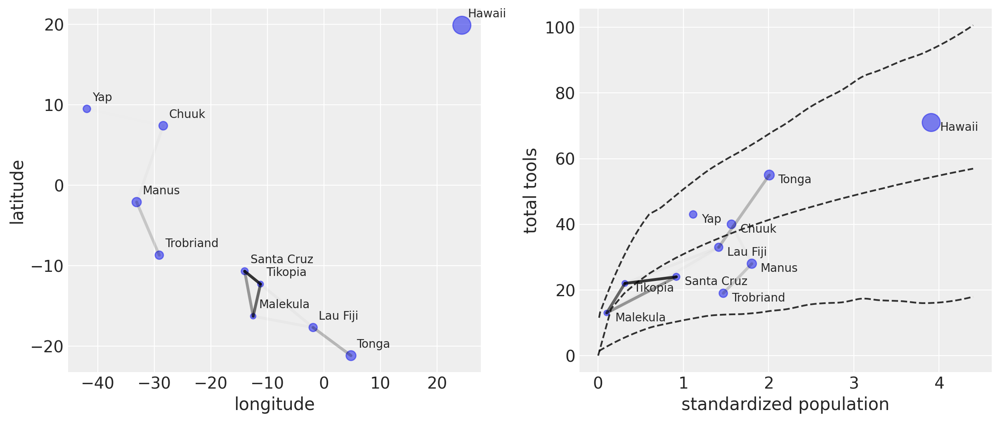

In [21]:
# Code 14.43
# scale point size to logpop
logpop = np.copy(dk["logpop"].values)
logpop /= logpop.max()
psize = np.exp(logpop * 5.5)

_, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

# plot raw data and labels
ax0.scatter(dk["lon2"], dk["lat"], psize, alpha=0.6)
labels = dk["culture"].values
for i, itext in enumerate(labels):
    ax0.text(dk["lon2"][i] + 1, dk["lat"][i] + 1, itext)

# overlay lines shaded by Rho
for i in range(10):
    for j in np.arange(i + 1, 10):
        ax0.plot(
            [dk["lon2"][i], dk["lon2"][j]],
            [dk["lat"][i], dk["lat"][j]],
            "k-",
            alpha=Rho.iloc[i, j] ** 2,
            lw=2.5,
        )

ax0.set_xlabel("longitude")
ax0.set_ylabel("latitude")

# Code 14.44
# compute posterior median relationship, ignoring distance
P_seq = np.linspace(-1.4, 3.0, 30) + 1.4  # our little trick from chp 11
lambda_post = (
    post["a"].values[:, None]
    * P_seq ** post["b"].values[:, None]
    / post["g"].values[:, None]
)

# plot raw data and labels
ax1.scatter(P, dk["total_tools"], psize, alpha=0.6)
labels = dk["culture"].values
for i, itext in enumerate(labels):
    ax1.text(P[i] + 0.1, dk["total_tools"][i] - 2.5, itext)

# display posterior predictions
ax1.plot(P_seq, np.median(lambda_post, axis=0), "--", color="k", alpha=0.8)
az.plot_hpd(
    P_seq,
    lambda_post,
    color="k",
    ax=ax1,
    fill_kwargs={"alpha": 0},
    plot_kwargs={"color": "k", "ls": "--", "alpha": 0.8},
)

# overlay correlations
for i in range(10):
    for j in np.arange(i + 1, 10):
        ax1.plot(
            [P[i], P[j]],
            [dk["total_tools"][i], dk["total_tools"][j]],
            "k-",
            alpha=Rho.iloc[i, j] ** 2,
            lw=2.5,
        )

ax1.set_xlabel("standardized population")
ax1.set_ylabel("total tools");

### Code 14.45


Related to Stan. PyMC3's GP module automatically reparametrizes with the Cholesky factor of the covariance matrix under the hood.

### 14.5.2. Example: Phylogenetic distance

### Code 14.46

The `ape`-package-related computations are very specific to the example and not related to PyMC usage, so let's just load the CSV file and the ready-made image:

In [6]:
Primates301 = pd.read_csv("Data/Primates301.csv", sep=";")
Primates301

,name,genus,species,subspecies,spp_id,genus_id,social_learning,research_effort,brain,body,group_size,gestation,weaning,longevity,sex_maturity,maternal_investment
0,Allenopithecus_nigroviridis,Allenopithecus,nigroviridis,NaN,1,1,0.0,6.0,58.02,4655.00,40.00,NaN,106.15,276.0,NaN,NaN
1,Allocebus_trichotis,Allocebus,trichotis,NaN,2,2,0.0,6.0,NaN,78.09,1.00,NaN,NaN,NaN,NaN,NaN
2,Alouatta_belzebul,Alouatta,belzebul,NaN,3,3,0.0,15.0,52.84,6395.00,7.40,NaN,NaN,NaN,NaN,NaN
3,Alouatta_caraya,Alouatta,caraya,NaN,4,3,0.0,45.0,52.63,5383.00,8.90,185.92,323.16,243.6,1276.72,509.08
4,Alouatta_guariba,Alouatta,guariba,NaN,5,3,0.0,37.0,51.70,5175.00,7.40,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
296,Trachypithecus_pileatus,Trachypithecus,pileatus,NaN,297,67,0.0,5.0,103.64,11794.00,8.50,NaN,NaN,NaN,NaN,NaN
297,Trachypithecus_poliocephalus,Trachypithecus,poliocephalus,NaN,298,67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
298,Trachypithecus_vetulus,Trachypithecus,vetulus,NaN,299,67,0.0,2.0,61.29,6237.00,8.35,204.72,245.78,276.0,1113.70,450.50
299,Varecia_rubra,Varecia,rubra,NaN,300,68,NaN,NaN,31.08,3470.00,NaN,NaN,NaN,NaN,NaN,NaN


![image](data/Primates301.png)

GLMs that try to include phylogenetic distance often go by the name **phylogenetic regression**.

$\mathbf{B} ∼ MVNormal(μ, \mathbf{S})$ 

$μ_i = α + β_GG_i + β_MM_i$

where $\mathbf{B}$ is a vector of species brain sizes and $\mathbf{S}$ is a covariance matrix with as many rows and columns as there are species. In an ordinary regression, this matrix takes the form

$\mathbf{S} = \sigma^2\mathbf{I}$

where σ is the same standard deviation

You can think of it as a correlation matrix in which all of the correlations are zero. So multiplying the variance into it just gives each species the same (residual) variance. It’s an ordinary linear regression, but thought of as having a single, multi-variate outcome.

### Code 14.47

In [7]:
dpymc = Primates301.dropna(subset=["group_size", "body", "brain"])
spp_obs = dpymc["name"]
dpymc

,name,genus,species,subspecies,spp_id,genus_id,social_learning,research_effort,brain,body,group_size,gestation,weaning,longevity,sex_maturity,maternal_investment
0,Allenopithecus_nigroviridis,Allenopithecus,nigroviridis,NaN,1,1,0.0,6.0,58.02,4655.0,40.00,NaN,106.15,276.0,NaN,NaN
2,Alouatta_belzebul,Alouatta,belzebul,NaN,3,3,0.0,15.0,52.84,6395.0,7.40,NaN,NaN,NaN,NaN,NaN
3,Alouatta_caraya,Alouatta,caraya,NaN,4,3,0.0,45.0,52.63,5383.0,8.90,185.92,323.16,243.6,1276.72,509.08
4,Alouatta_guariba,Alouatta,guariba,NaN,5,3,0.0,37.0,51.70,5175.0,7.40,NaN,NaN,NaN,NaN,NaN
5,Alouatta_palliata,Alouatta,palliata,NaN,6,3,3.0,79.0,49.88,6250.0,13.10,185.42,495.60,300.0,1578.42,681.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,Trachypithecus_obscurus,Trachypithecus,obscurus,NaN,295,67,0.0,6.0,62.12,7056.0,10.00,146.63,362.93,300.0,NaN,509.56
295,Trachypithecus_phayrei,Trachypithecus,phayrei,NaN,296,67,0.0,16.0,72.84,7475.0,12.90,180.61,305.87,NaN,NaN,486.48
296,Trachypithecus_pileatus,Trachypithecus,pileatus,NaN,297,67,0.0,5.0,103.64,11794.0,8.50,NaN,NaN,NaN,NaN,NaN
298,Trachypithecus_vetulus,Trachypithecus,vetulus,NaN,299,67,0.0,2.0,61.29,6237.0,8.35,204.72,245.78,276.0,1113.70,450.50


### Code 14.48

In [8]:
N_spp = len(dpymc)
M = preprocessing.scale(np.log(dpymc.body))
B = preprocessing.scale(np.log(dpymc.brain))
G = preprocessing.scale(np.log(dpymc.group_size))
Imat = np.diag(np.ones(N_spp))

In [ ]:
# define model: brian ~ mass + group
with pm.Model() as m14_8:
    
    # fixed priors
    a = pm.Normal('a', mu=0.0, sd=1.0)
    bM = pm.Normal('bM', mu=0.0, sd=0.5)
    bG = pm.Normal('bG', mu=0.0, sd=0.5)
    sigma_sq = pm.Exponential('sigma_sq', 1.0)
    
    # matrix of varying effects
    SIGMA = pm.Deterministic('SIGMA', Imat * sigma_sq)

    # linear model
    mu = pm.Deterministic('mu', a + bM*M + bG*G)
    
    # likelihood
    Body = pm.MvNormal('Body', mu=mu, cov=SIGMA, observed=B) 

    trace_m14_8 = pm.sample(random_seed=RANDOM_SEED)
    idata_m14_8 = az.from_pymc3(trace_m14_8)

In [ ]:
# show model summary
varnames = ['~mu','~SIGMA']
az.summary(idata_m14_8, varnames, round_to=2, hdi_prob=0.89)

### Code 14.49

The `ape`-package-related computations are very specific to the example and not related to PyMC usage, so let's just load the CSV files:

In [9]:
V = pd.read_csv("Data/Primates301_vcov_matrix.csv", index_col=0)
Dmat = pd.read_csv("Data/Primates301_distance_matrix.csv", index_col=0)

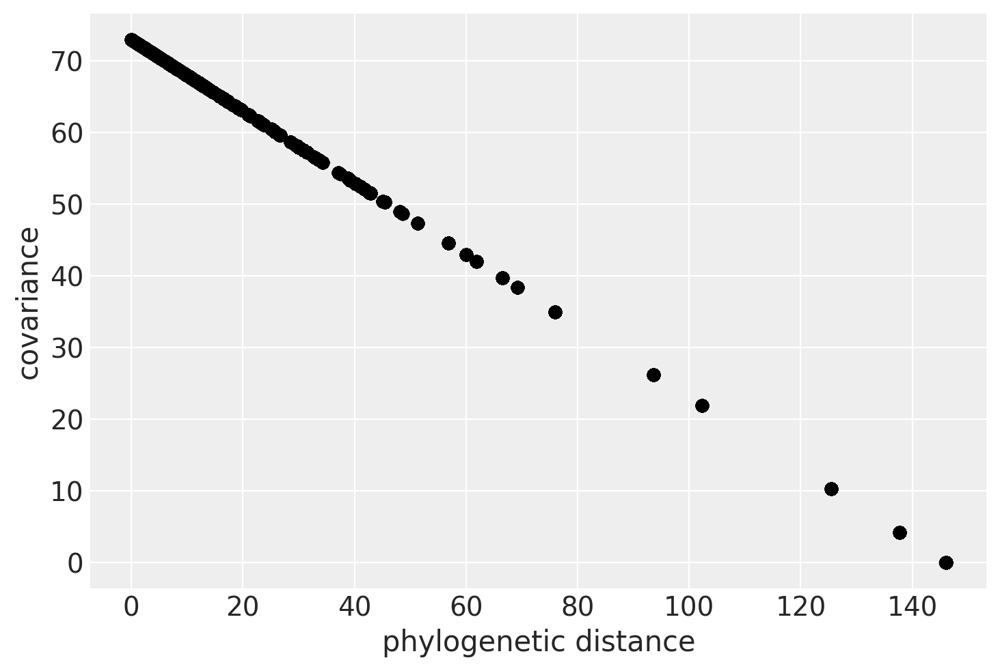

In [10]:
plt.plot(Dmat, V, "ko")
plt.xlabel("phylogenetic distance")
plt.ylabel("covariance");

The first regression is one of the oldest and most conservative, a **Brownian motion** interpretation of the phylogeny that implies a very particular covari- ance matrix. Brownian motion just means Gaussian random walks. If species traits drift randomly with respect to one another after speciation, then the covariance between a pair of species ends up being linearly related to the phylogenetic branch distance between them— the further apart, the less covariance, as a proportion of distance. 

### Code 14.50

In [11]:
# put species in right order
V_ord = V.loc[spp_obs, spp_obs]
# convert to correlation matrix
R = (V_ord / V_ord.max()).values

In [ ]:
# define model: brian ~ mass + group
with pm.Model() as m14_9:
    
    # fixed priors
    a = pm.Normal('a', mu=0.0, sd=1.0)
    bM = pm.Normal('bM', mu=0.0, sd=0.5)
    bG = pm.Normal('bG', mu=0.0, sd=0.5)
    sigma_sq = pm.Exponential('sigma_sq', 1.0)
    
    # matrix of varying effects
    SIGMA = pm.Deterministic('SIGMA', R * sigma_sq)

    # linear model
    mu = pm.Deterministic('mu', a + bM*M + bG*G)
    
    # likelihood
    Body = pm.MvNormal('Body', mu=mu, cov=SIGMA, observed=B) 

    trace_m14_9 = pm.sample(random_seed=RANDOM_SEED)
    idata_m14_9 = az.from_pymc3(trace_m14_9)

The Brownian motion model is a special kind of Gaussian process in which the covari- ance declines in a very rigid way with increasing distance. There is no need to be so rigid and good reason to think evolution is not well-described by Brownian motion. It’s very common to use something called **Pagel’s lambda** to modify the Brownian motion model. But all this does is scale all of the species correlations by a common factor. It maintains the same arbitrary and unrealistic distance model. 

Another common alternative is the **Ornstein–Uhlenbeck process** (or OU process), which is a damped Brownian motion process that tends to return towards some mean (or means). What this does in practice is constrain the variation, making the relationship between phylogenetic distance and covariance non-linear.

Moreprecisely,the OU process just defines the covariance between two species $i$ and $j$ as:

$K(i, j) = \eta^2exp(−\rho^2D_{ij})$

This is an exponential distance kernel, unlike the quadratic kernel in the previous example. The exponential kernel says that covariance between points (species) declines rapidly, making for much less smooth functions. 


### Code 14.51

In [12]:
# scale and reorder distance matrix
Dmat_ord = (Dmat.loc[spp_obs, spp_obs] / Dmat.loc[spp_obs, spp_obs].max()).values

This is a good opportunity to show a use-case of PyMC3's GP module. In the Oceanic tools example above, we didn't need a mean function (which means it was automatically set to 0 by PyMC3). Now however, we need both a mean function _and_ a covariance function to specify our GP. The covariance function will look familiar. For the mean function, we could use `gp.mean.Linear`, which takes as input a matrix of coefficients and a vector of intercepts. But that mean function would then be evaluated on our distance matrix, as `SIGMA` will be.

We don't want that -- we only want the mean function to depend on `M` and `G` not on the phylogenetic distance. We can easily [define a custom mean function](https://docs.pymc.io/notebooks/GP-MeansAndCovs.html#Defining-a-custom-mean-function) in PyMC3. We just need to subclass `pm.gp.mean.Mean` and provide `__call__` and `__init__` methods:

In [13]:
class LinearMean(pm.gp.mean.Mean):
    def __init__(self, intercept, slopes):
        self.intercept = intercept
        self.slopes = slopes

    def __call__(self, X):
        """In the trace summary, b0 will be bM and b1 will be bG"""
        return self.intercept + self.slopes[0] * M + self.slopes[1] * G

And we can easily use this function in our model below. Notice we use `pm.gp.Marginal` and `gp.marginal_likelihood` instead of `pm.gp.Latent` and `gp.prior` as in the Oceanic tools example. It's because here we have a (multivariate) normal likelihood, which works well analytically with a GP prior, so `Marginal` and `marginal_likelihood` just take advantage of the closed-form solution to speed-up computations. It's also why you see no calls to `pm.MvNormal` below: this is implicit in `marginal_likelihood`, which evaluates the GP at the `X` points (`Dmat_ord`). And do you recall what the evaluation of a GP is? An MvNormal random variable -- bingo!

In [ ]:
# define model: brian ~ mass + group
with pm.Model() as m14_10:
    
    # fixed priors
    a = pm.Normal('a', mu=0.0, sd=1.0)
    b = pm.Normal('b', mu=0.0, sd=0.5, shape=2)
    
    # specify the mean function:
    mu = LinearMean(intercept=a, slopes=b)

    # half_normal(1, 0.25) is too strong
    etasq = pm.Exponential("etasq", 1.0)
    rhosq = pm.Normal("rhosq", 3.0, 0.25)
    
    # specify the covariance function:
    SIGMA = etasq * pm.gp.cov.Exponential(input_dim=1, ls=rhosq)

    # specify the GP:
    gp = pm.gp.Marginal(mean_func=mu, cov_func=SIGMA)

    # place a GP prior over the observations.
    # SIGMA will be conditioned on Dmat_ord.
    # mu won't be, as we coded it on purpose.
    sigma = pm.Exponential("sigma", 1.0)
    Body = gp.marginal_likelihood("Body", X=Dmat_ord, y=B, noise=sigma)

    trace_m14_10 = pm.sample(2000, tune=2000, target_accept=0.9, random_seed=RANDOM_SEED)
    idata_m14_10 = az.from_pymc3(trace_m14_10)

In [ ]:
# b0 is bM and b1 is bG
az.summary(idata_14_11, round_to=2)

All the posteriors are looking good and similar to the book, except for `etasq`. If you replace `etasq = pm.Exponential('etasq', 1.0)` by  `etasq = pm.Normal('etasq', 1.0, 0.25)`, you will see that this prior is too strong and is not moved by the data, which is why I changed it. Moreover, I don't understand how the results for `etasq` reported in the book could be so close to 0 ($[0.03, 0.05]$), especially with a prior as strong as `half_normal(1, 0.25)`.

### Code 14.52

In [ ]:
d_seq = np.linspace(0, Dmat_ord.max(), 100)
post = idata_m14_11.posterior.stack(sample=("chain", "draw"))

_, ax = plt.subplots(1, 1, figsize=(7, 5))

# prior mean and 89% interval
eta = np.random.exponential(1.0, 1000)
rho = np.random.normal(3.0, 0.25, 1000)
K = []
for d in d_seq:
    K.append(eta * np.exp(-rho * d))
K = np.asarray(K)

ax.plot(d_seq, K.mean(1), "k", alpha=0.8, lw=2)
az.plot_hdi(d_seq, K.T, color="k", ax=ax)

# posterior
post_etasq = post["etasq"][::50].values[:, None]
post_rhosq = post["rhosq"][::50].values[:, None]
ax.plot(d_seq, (post_etasq * np.exp(-post_rhosq * d_seq)).T, "b", alpha=0.1)

ax.set(xlabel="phylogenetic distance", ylabel="covariance");

###  Referece

[pymc-devs: Rethinking_2 Chp14](https://github.com/pymc-devs/resources/blob/master/Rethinking_2/Chp_14.ipynb)